# Translational mapping

In this notebook we explicitely model the link between the regulatory and structural embeddings of the U2OS cells and evaluate their generalizability.

---


## 0. Enviromental setup

We first load the required packages and define a number of helper functions.

In [364]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import copy
from torch import nn
from torch.optim import Adam
import sys
from tqdm.notebook import tqdm
from yellowbrick.cluster.elbow import kelbow_visualizer
from yellowbrick.cluster import KElbowVisualizer
from torch.utils.data import DataLoader
import matplotlib as mpl
from sklearn.preprocessing import normalize
from sklearn.cluster import AgglomerativeClustering
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
import os

sys.path.append("../../..")

from src.utils.notebooks.translation.analysis import *
from src.data.datasets import IndexedTensorDataset
from src.utils.basic.io import get_genesets_from_gmt_file

mpl.rcParams["figure.dpi"] = 600


seed = 1234

device = "cuda:0"

%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [268]:
def read_in_loto_embs(
    root_dir,
    exp_dir,
    gae_exp,
    avg_pert_embs=True,
    normalize_reg_embs=False,
    exclude_ctrl=True,
):
    oe_targets = sorted(os.listdir(root_dir))

    pert_embs_dict = {}
    reg_embs_dict = {}
    for oe_target in tqdm(oe_targets):
        target_dir = os.path.join(root_dir, oe_target)
        pert_embs = pd.read_hdf(os.path.join(target_dir, "phy_embs.h5"))
        if exclude_ctrl:
            pert_embs = pert_embs.loc[pert_embs.labels != "EMPTY"]

        # Decide to read in average (bulk) or single-cell perturbation gene embeddings
        if avg_pert_embs:
            pert_embs_dict[oe_target] = pert_embs.groupby("labels").mean()
        else:
            pert_embs_dict[oe_target] = pert_embs

        reg_embs = pd.read_csv(
            os.path.join(target_dir, exp_dir, gae_exp, "node_embs.csv"), index_col=0
        )
        # Normalize gene embeddings such that euclidean distances correspond to cosine distances
        if normalize_reg_embs:
            reg_embs = pd.DataFrame(
                normalize(reg_embs), index=reg_embs.index, columns=reg_embs.columns
            )
        reg_embs_dict[oe_target] = reg_embs
    return pert_embs_dict, reg_embs_dict

<IPython.core.display.Javascript object>

In [810]:
from numpy.linalg import solve


class NTK:
    def __init__(self):
        super().__init__()
        self.sol = None
        self.Xtrain = None

    def kernel(self, pair1, pair2):

        out = pair1 @ pair2.T + 1
        N1 = np.sum(np.power(pair1, 2), axis=-1).reshape(-1, 1) + 1
        N2 = np.sum(np.power(pair2, 2), axis=-1).reshape(-1, 1) + 1

        XX = np.sqrt(N1 @ N2.T)
        out = out / XX

        out = np.clip(out, -1, 1)

        first = (
            1
            / np.pi
            * (out * (np.pi - np.arccos(out)) + np.sqrt(1.0 - np.power(out, 2)))
            * XX
        )
        sec = 1 / np.pi * out * (np.pi - np.arccos(out)) * XX
        out = first + sec

        C = 1
        return out / C

    def fit(self, Xtrain, ytrain):
        K = self.kernel(Xtrain, Xtrain)
        reg = 1e1
        sol = solve(K + reg * np.eye(len(K)), ytrain).T
        self.sol = sol
        self.Xtrain = Xtrain
        return self

    def predict(self, X):
        K = self.kernel(self.Xtrain, X)
        return (self.sol @ K).T

<IPython.core.display.Javascript object>

In [815]:
def get_prediction_for_model(
    X_train,
    Y_train,
    x_test,
    model_type="synthetic_intervention",
    model=None,
    Y_all=None,
    scale_x=False,
    scale_y=False,
    gamma=1,
):
    X_train = np.array(X_train)
    Y_train = np.array(Y_train)
    x_test = np.array(x_test)
    if scale_x:
        sc = StandardScaler().fit(X_train)
        X_train = sc.transform(X_train)
        x_test = sc.transform(x_test)
    if scale_y:
        sc = StandardScaler().fit(Y_train)
        Y_train = sc.transform(Y_train)
    if model_type == "synthetic_intervention":
        alpha = np.matmul(np.array(x_test), np.linalg.pinv(np.array(X_train)))
        y_test = np.matmul(alpha, np.array(Y_train))
    elif model_type == "linear_regression":
        model = LinearRegression()
        model = model.fit(X_train, Y_train)
        y_test = model.predict(x_test)
    elif model_type == "kernel_regression":
        model = KernelRidge(kernel="rbf", alpha=0, gamma=gamma)
        model = model.fit(X_train, Y_train)
        y_test = model.predict(x_test)
    elif model_type == "mean":
        y_test = np.array(Y_train).mean(axis=0).reshape((1, -1))
    elif model_type == "mean_all":
        y_test = np.array(Y_all).mean(axis=0).reshape((1, -1))

    elif model_type == "ntk":
        model = NTK()
        Y_train_means = np.repeat(
            Y_train.mean(axis=0).reshape(1, -1), len(X_train), axis=0
        )
        #         X_train = np.concatenate([X_train, Y_train_means], axis=-1)
        #         x_test = np.concatenate([x_test, Y_train_means[0].reshape(1, -1)], axis=-1)
        model = model.fit(X_train, Y_train)
        y_test = model.predict(np.array(x_test))
    else:
        if model is not None:
            model = model.fit(X_train, Y_train)
            y_test = model.predict(x_test)
        else:
            raise NotImplementedError
    if scale_y:
        y_test = sc.inverse_transform(y_test)
    return normalize(y_test)

<IPython.core.display.Javascript object>

In [345]:
def get_nn_prediction_dict(
    reg_embs_dict,
    pert_embs_dict,
    model_type="synthethic_intervention",
    model=None,
    permute=False,
):
    nn_pred_dict = {}
    oe_targets = set(list(reg_embs_dict.values())[0].index)
    oe_targets = oe_targets.intersection(list(pert_embs_dict.values())[0].index)
    for target in sorted(list(oe_targets)):

        # Get perturbation and regulatory gene embeddings for hold-out gene target.
        reg_embs = reg_embs_dict[target]
        pert_embs = pert_embs_dict[target]

        # Randomly permute both embeddings to compute a random baseline
        if permute:
            reg_embs = pd.DataFrame(
                np.random.permutation(np.array(reg_embs)),
                index=reg_embs.index,
                columns=reg_embs.columns,
            )
            pert_embs = pd.DataFrame(
                np.random.permutation(np.array(pert_embs)),
                index=pert_embs.index,
                columns=pert_embs.columns,
            )

        # Identify genes with both corresponding perturbation and regulatory gene embeddings
        shared_targets = set(reg_embs.index).intersection(pert_embs.index)
        # Focus on the perturbation gene embeddings with corresponding regulatory gene embeddings
        pert_embs = pert_embs.loc[shared_targets]

        # Estimate the NearestNeighbor graph of the regulatory gene embeddings using euclidean distances
        reg_nn = NearestNeighbors(n_neighbors=len(reg_embs))
        reg_samples = np.array(list(reg_embs.index))
        reg_nn.fit(np.array(reg_embs))

        # Extract perturbation gene names
        pert_samples = np.array(list(pert_embs.index))

        # Identify the test and train samples as the perturbation gene embeddings of the hold-out gene target
        # and all others respectively
        x_test = pert_embs.loc[pert_samples == target]
        X_train = pert_embs.loc[pert_samples != target]

        # Get corresponding regulatory gene embeddings of training samples
        Y_train = reg_embs.loc[pert_samples[pert_samples != target]]

        # Get the predicted regulatory gene embedding for the hold-out gene target
        y_test = get_prediction_for_model(
            X_train=X_train,
            Y_train=Y_train,
            x_test=x_test,
            model_type=model_type,
            model=model,
            Y_all=reg_embs,
        )
        # Identify the sorted nearest neighbor list of the prediction among all regulatory gene embeddings
        reg_nns = reg_samples[reg_nn.kneighbors(y_test, return_distance=False)][0]
        nn_pred_dict[target] = reg_nns

        if not permute:
            print(model_type, target, reg_nns[:5])
            print(y_test)

    # Return a dictionary with the key identifying the hold-out gene target and the corresponding value the
    # names of the regulatory gene embeddings closest to the prediction in increasing euclidean distance
    return nn_pred_dict

<IPython.core.display.Javascript object>

In [45]:
def get_knn_acc_from_nn_dict(nn_dict, ks=list(range(50))):
    # Function to compute for varying ks whether or not the regulatory gene embedding of the hold-out target
    # is among the k-nearest neighbors of the prediction using the nearest neighbor dictionary of the prediction
    idc = []
    topk_dict = {}
    for target, nns in nn_dict.items():
        idc.append(target)
        for k in ks:
            if "top-{}".format(k) not in topk_dict:
                topk_dict["top-{}".format(k)] = []
            topk_dict["top-{}".format(k)].append(int(target in list(nns)[:k]))
    topk_result = pd.DataFrame(topk_dict, index=idc)
    return topk_result

<IPython.core.display.Javascript object>

In [66]:
def get_knn_acc_for_model(
    reg_embs_dict,
    pert_embs_dict,
    model_type="synthetic_intervention",
    model=None,
    ks=None,
):
    # Function to compute the nearest neighbor accuracy for a given set of perturbation and
    # regulatory gene embeddings for a specified model type
    n_shared_targets = len(
        set(list(pert_embs_dict.values())[0].index).intersection(
            list(reg_embs_dict.values())[0].index
        )
    )
    if ks is None:
        ks = list(range(1, 51))
    knn_acc_results = {"knn_acc": [], "k": []}

    # Get nearest-neighbor prediction dictionary
    nn_dict = get_nn_prediction_dict(
        reg_embs_dict=reg_embs_dict,
        pert_embs_dict=pert_embs_dict,
        model_type=model_type,
        model=model,
        permute=False,
    )
    knn_acc = get_knn_acc_from_nn_dict(nn_dict, ks=ks)
    avg_knn_acc = knn_acc.mean()
    for k in ks:
        knn_acc_results["knn_acc"].append(avg_knn_acc.loc["top-{}".format(k)])
        knn_acc_results["k"].append(k)
    knn_acc_results = pd.DataFrame(knn_acc_results)
    return knn_acc_results

<IPython.core.display.Javascript object>

In [70]:
def get_perm_knn_acc_for_model(
    reg_embs_dict,
    pert_embs_dict,
    model_type="synthetic_intervention",
    model=None,
    ks=None,
    b=500,
    random_state=1234,
    n_clusters=None,
):
    # Function that also computes the knn accuracy for a given model/type but randomly permutes the perturbation
    # and regulatory gene embeddings to establish a random baseline

    if n_clusters is not None:
        reduced_reg_embs_dict = get_reduced_reg_embs_dict(
            reg_embs_dict, n_clusters=n_clusters
        )
    else:
        reduced_reg_embs_dict = reg_embs_dict

    n_shared_targets = len(
        set(list(pert_embs_dict.values())[0].index).intersection(
            list(reduced_reg_embs_dict.values())[0].index
        )
    )

    np.random.seed(random_state)
    if ks is None:
        ks = list(range(1, 51))
    knn_acc_results = {"knn_acc": [], "k": []}
    for i in tqdm(range(b)):
        nn_dict = get_nn_prediction_dict(
            reg_embs_dict=reduced_reg_embs_dict,
            pert_embs_dict=pert_embs_dict,
            model_type=model_type,
            model=model,
            permute=True,
        )
        knn_acc = get_knn_acc_from_nn_dict(nn_dict, ks=ks)
        avg_knn_acc = knn_acc.mean()
        for k in ks:
            knn_acc_results["knn_acc"].append(avg_knn_acc.loc["top-{}".format(k)])
            knn_acc_results["k"].append(k)
    knn_acc_results = pd.DataFrame(knn_acc_results)
    return knn_acc_results

<IPython.core.display.Javascript object>

In [48]:
def get_reduced_reg_embs_dict(
    reg_embs_dict, n_clusters=5, affinity="euclidean", linkage="complete"
):
    # Function to filter out genes that do not cluster with any of the genes with corresponding perturbation gene
    # embeddings. This is supposed to enable the derivation of a more conservative baseline where only any of the
    # genes clustering with the genes with corresponding perturbation gene embeddings can be randomly predicted.
    reduced_reg_embs_dict = copy.deepcopy(reg_embs_dict)
    for k, v in reduced_reg_embs_dict.items():
        agglo_cl = AgglomerativeClustering(
            n_clusters=n_clusters, affinity=affinity, linkage=linkage
        )
        cluster_labels = agglo_cl.fit_predict(np.array(v))
        cluster_labels = pd.DataFrame(
            cluster_labels, columns=["cluster"], index=v.index
        )
        target_clusters = np.unique(
            cluster_labels.loc[
                cluster_labels.index.isin(list(reduced_reg_embs_dict.keys()))
            ]
        )
        reduced_reg_embs_dict[k] = v.loc[
            cluster_labels.loc[cluster_labels.cluster.isin(target_clusters)].index
        ]
    return reduced_reg_embs_dict

<IPython.core.display.Javascript object>

In [73]:
def get_all_loto_knn_accs_for_model(
    reg_embs_dict,
    pert_embs_dict,
    alpha,
    beta,
    gamma,
    graph,
    cluster,
    model_type="synthetic_intervention",
    model=None,
    b=50,
    n_clusters=5,
):
    knn_acc_results = get_knn_acc_for_model(
        reg_embs_dict=reg_embs_dict,
        pert_embs_dict=pert_embs_dict,
        model_type=model_type,
        model=model,
    )
    knn_acc_results["alpha"] = alpha
    knn_acc_results["beta"] = beta
    knn_acc_results["gamma"] = gamma
    knn_acc_results["graph"] = graph
    knn_acc_results["cluster"] = cluster
    knn_acc_results["model"] = model_type

    perm_knn_acc_results = get_perm_knn_acc_for_model(
        reg_embs_dict=reg_embs_dict,
        pert_embs_dict=pert_embs_dict,
        model_type=model_type,
        model=model,
        b=b,
    )
    perm_knn_acc_results["alpha"] = alpha
    perm_knn_acc_results["beta"] = beta
    perm_knn_acc_results["gamma"] = gamma
    perm_knn_acc_results["graph"] = graph
    perm_knn_acc_results["cluster"] = cluster
    perm_knn_acc_results["model"] = model_type

    perm_cluster_knn_acc_results = get_perm_knn_acc_for_model(
        reg_embs_dict=reg_embs_dict,
        pert_embs_dict=pert_embs_dict,
        model_type=model_type,
        model=model,
        b=b,
        n_clusters=n_clusters,
    )
    perm_cluster_knn_acc_results["alpha"] = alpha
    perm_cluster_knn_acc_results["beta"] = beta
    perm_cluster_knn_acc_results["gamma"] = gamma
    perm_cluster_knn_acc_results["graph"] = graph
    perm_cluster_knn_acc_results["cluster"] = cluster
    perm_cluster_knn_acc_results["model"] = model_type

    return knn_acc_results, perm_knn_acc_results, perm_cluster_knn_acc_results

<IPython.core.display.Javascript object>

In [614]:
def plot_translation_performance(
    results,
    perm_results,
    hue,
    ymax,
    title="",
    perm_cluster_results=None,
    mean_baseline=None,
    figsize=[9, 6],
    cmap=None,
    style=None,
    style_order=None,
    param_title=None,
    legend_title="Model",
):
    if param_title is None:
        param_title = hue
    fig, ax = plt.subplots(figsize=figsize)
    ax = sns.lineplot(
        data=results,
        x="k",
        y="knn_acc",
        hue=hue,
        palette=cmap,
        style=style,
        style_order=style_order,
    )
    ax = sns.lineplot(
        data=perm_results,
        x="k",
        y="knn_acc",
        ax=ax,
        label="Random baseline",
        color="dimgray",
        legend=False,
    )
    if perm_cluster_results is not None:
        ax = sns.lineplot(
            data=perm_cluster_results,
            x="k",
            y="knn_acc",
            ax=ax,
            label="Random cluster baseline",
            color="silver",
            legend=False,
        )
    if mean_baseline is not None:
        ax = sns.lineplot(
            data=mean_baseline,
            x="k",
            y="knn_acc",
            ax=ax,
            label="Mean baseline",
            color="orange",
            legend=False,
        )
    ax.set_title(title)
    ax.set_xticks(np.arange(0, 51, 5))
    ax.set_yticks(np.arange(0, ymax, 0.05))
    ax.legend(title=legend_title, loc="upper left", frameon=True)

    return fig, ax

<IPython.core.display.Javascript object>

---

## 1. Read in data

Next, we read in the different data sets that we will use for the modelling and evaluation of the translational mappings in the leave-one-target-out setup. That is we will load for a given model configuration the respective gene regulatory and physical embeddings.

In [520]:
root_dir = (
    "../../../data/experiments/image_embeddings/specificity_target_emb_loto/embeddings"
)
exp_dir = "spearman_sol"

<IPython.core.display.Javascript object>

In [701]:
oe_targets = sorted(os.listdir(root_dir))
gae_exps = [
    #     "gae_exp_a0_b0_g1_split_graph_physical",
    #     "gae_exp_a1_b0_g0_split_graph_physical",
    #          "gae_exp_a1_b0_g1_split_graph_cmap",
    #          "gae_exp_a1_b0_g1_split_graph_cmap_full",
    #     "gae_exp_a1_b0_g1_split_graph_physical",
    #          "gae_exp_a1_b0_g1_split_graph_physical_full",
    #          "gae_exp_a1_b0_g2_split_graph_physical",
    #          "gae_exp_a1_b0_g5_split_graph_physical",
    #          "gae_exp_a1_b1_g1_split_graph_physical",
    #          "gae_exp_a1_b2_g1_split_graph_physical",
    #         "gae_exp_a1_b5_g1_split_graph_physical",
    #      "gae_exp_a1_b0_g0_split_graph_physical_2"
    "gae_exp_a1_b0_g0_split_graph_physical_4"
]
# exp_embs_dict = {}

<IPython.core.display.Javascript object>

In [702]:
for gae_exp in gae_exps:
    pert_embs_dict, reg_embs_dict = read_in_loto_embs(
        root_dir=root_dir,
        exp_dir=exp_dir,
        gae_exp=gae_exp,
        avg_pert_embs=True,
        normalize_reg_embs=True,
        exclude_ctrl=True,
    )
    exp_embs_dict[gae_exp] = {
        "pert_embs": copy.deepcopy(pert_embs_dict),
        "reg_embs": copy.deepcopy(reg_embs_dict),
    }

  0%|          | 0/42 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

---

---

## 2. Structural NN translation


To this end, we will first establish a baseline, where the translation is given by describing the embedding of the gene targeted in each OE conditions that was hold out as a linear combination of its nearest neighbors of the ones available during training. The computed weighting scheme will be transfered to the regulatory space yielding a predicted location for the hold-out OE condition in that space. We will assess using the topk accuracy of how close the embedding of the gene perturbed in the hold-out condition is to the predicted location.

---

### 2.1. Experiments

To this end, we first look at a number of performed experiments. Those experiments vary on how the regulatory space was inferred, i.e. the weighting of the three loss terms jointly defining the objective the GAE model is trained on:

$$
\mathcal{L}_{recon} = \alpha\mathcal{L}_{network} + \beta\mathcal{L}_{features} + \gamma \mathcal{L}_{cluster},
$$
where the corresponding terms stand for the network reconstruction loss given by the BCE loss of the reconstructed probabilistic adjacency matrix, the feature reconstruction loss given by the L1 loss of the reconstructed single-cell gene expression profiles and hot-one-encoded Hallmark gene set memberships and the cluster reconstruction loss measuring how well the cluster structure of the physical space is maintained using a weighted CE loss.

First, we will assess the models using the previously described NN translation approach that predicts a location $y^*$ in the regulatory space $\mathcal{R}$ given a location $x^*$ in the physical space $\mathcal{P}$ as follows:
$$
\alpha = x^* X_{\mathcal{N}^{(n)}_{\mathcal{P}}(x^*)}^\dagger,
$$
$$
y^* = \alpha Y_{\mathcal{N}^{(n)}_{\mathcal{P}}(x^*)},
$$

where $X, Y$ are the physical and regulatory space embeddings respectively and $\mathcal{N}^{(n)}_{\mathcal{P}}(x)$ defines the set of $n$ nearest neighbors of $x$ in the physical space embeddings $X$ not including $x$.

We also distinguish between whether or not the GAE model was trained by leaving out links for validation and testing during the regulatory space inference following the setup proposed by Kipf & Welling (2017) (split setup) or if the full graph was used for forward passes during training (full setup).

In [725]:
knn_acc_results_dict = {}
model_types = [
    "mean",
    "ntk",
    "synthetic_intervention",
    "linear_regression",
    "kernel_regression",
]
b = 1

<IPython.core.display.Javascript object>

---

#### 2.1.a. Experiment 1

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (0,0,1)$ using the graph in a link-splitting setting and the physical space clusters in the loto-setting.

In [626]:
gae_exp = "gae_exp_a0_b0_g1_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [627]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=0,
        beta=0,
        gamma=1,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['FSTL1' 'S100A2' 'THRA' 'MAGEA4' 'VIM']
[[-0.0334738  -0.05118628 -0.02383997 ... -0.01881122  0.03100638
   0.0203853 ]]
mean ATF4 ['RARA' 'FKBP4' 'CRMP1' 'HSPB1' 'TUBA1A']
[[-0.04800755 -0.07225654 -0.02503885 ... -0.04798459  0.01389705
   0.02625359]]
mean BAX ['TUBA1A' 'HSPB1' 'CLU' 'CRMP1' 'FSTL1']
[[-0.05904236 -0.05716763 -0.00916521 ... -0.03117109 -0.00335853
   0.0002126 ]]
mean BCL2L11 ['ATXN7' 'TUBA1A' 'MAGEA4' 'YWHAQ' 'HSPB1']
[[-0.02754644 -0.04551198  0.00166219 ... -0.02741055 -0.02514289
  -0.00951444]]
mean BRAF ['KPNA2' 'ATXN7' 'CDC42' 'MAGED1' 'GSK3B']
[[-0.01177433 -0.04727781  0.01398115 ... -0.03471519 -0.0130329
  -0.02113343]]
mean CASP8 ['CNN1' 'TUBA1A' 'KRT8' 'CLU' 'TNNT1']
[[-0.06458225 -0.01798933 -0.02887373 ... -0.03003602  0.01341941
  -0.02021807]]
mean CDC42 ['APPBP2' 'MAGEA6' 'FSTL1' 'S100A14' 'YWHAQ']
[[-0.02041512 -0.06379535 -0.01098267 ... -0.0229418   0.00999855
   0.00953348]]
mean CDKN1A ['FSTL1' 'MAGEA4' 'CLU' 'VIM' 'YWHAQ']
[[-0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['CD40' 'TRAF2' 'PRAME' 'STAC' 'LZTS2']
[[ 0.00818938 -0.05149248 -0.02333719 ...  0.05282523  0.01483969
   0.00666315]]
synthetic_intervention ATF4 ['GSK3B' 'TSC2' 'FOXO1' 'LOXL4' 'NOTCH3']
[[-0.05309242 -0.06994115 -0.03727551 ... -0.01865359  0.00205427
   0.01141608]]
synthetic_intervention BAX ['GSK3B' 'TSC2' 'ATF4' 'KPNA2' 'NCAM1']
[[-0.07656481 -0.03161253 -0.02376502 ... -0.01408914  0.00212077
   0.02606294]]
synthetic_intervention BCL2L11 ['CD40' 'EFEMP1' 'LZTS2' 'TRAF2' 'KPNA2']
[[-0.01674743  0.00836047  0.03052876 ... -0.02284693 -0.0251539
   0.0134439 ]]
synthetic_intervention BRAF ['PRKCE' 'CDC42' 'MYL2' 'PAK2' 'PDGFRB']
[[ 0.00391529 -0.06880098  0.00554908 ... -0.03217764 -0.00829431
  -0.03666306]]
synthetic_intervention CASP8 ['SRC' 'ARMCX2' 'PRAME' 'FKBP4' 'HRAS']
[[-0.04635434 -0.00918961  0.00277356 ... -0.00859651  0.02550511
   0.02458637]]
synthetic_intervention CDC42 ['RAF1' 'MAGEA12' 'HK2' 'MAPK8' 'ARMCX2']
[[-0.00767631 -0.052

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['TRAF2' 'CD40' 'PRAME' 'STAC' 'LZTS2']
[[ 0.00821685 -0.05162723 -0.02348304 ...  0.05276177  0.01500412
   0.00680796]]
linear_regression ATF4 ['GSK3B' 'TSC2' 'FOXO1' 'LOXL4' 'NOTCH3']
[[-0.0531223  -0.07008586 -0.037275   ... -0.01848447  0.00189763
   0.01105408]]
linear_regression BAX ['GSK3B' 'ATF4' 'TSC2' 'KPNA2' 'NCAM1']
[[-0.07643569 -0.03167245 -0.02421727 ... -0.01406884  0.00216119
   0.02667119]]
linear_regression BCL2L11 ['CD40' 'EFEMP1' 'TRAF2' 'LZTS2' 'DIABLO']
[[-0.01495499  0.00843672  0.03119678 ... -0.02058095 -0.02516602
   0.01293631]]
linear_regression BRAF ['PRKCE' 'CDC42' 'MYL2' 'PAK2' 'RAF1']
[[ 0.00336602 -0.06893688  0.00518834 ... -0.03280146 -0.00796723
  -0.03682213]]
linear_regression CASP8 ['SRC' 'ARMCX2' 'PRAME' 'HRAS' 'FKBP4']
[[-0.04667987 -0.00872008  0.00342429 ... -0.00793871  0.02642732
   0.02648311]]
linear_regression CDC42 ['RAF1' 'MAGEA12' 'HK2' 'MAPK8' 'ARMCX2']
[[-0.00736259 -0.05209379  0.00844884 ... -0.04314741 -

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['EFEMP1' 'LZTS2' 'THRA' 'RARA' 'PTCH1']
[[-0.02391614 -0.05474349 -0.04075137 ...  0.02727422  0.02463506
   0.00544244]]
kernel_regression ATF4 ['SDC2' 'SDC3' 'TNNT1' 'SDC1' 'FBN1']
[[-0.04257377 -0.06494484 -0.02049683 ... -0.02122623  0.01598558
   0.02586521]]
kernel_regression BAX ['PRKCA' 'FHL2' 'CREB1' 'TSC2' 'TNNT2']
[[-0.05337625 -0.06293407 -0.04083611 ...  0.02663303 -0.01785816
   0.0086793 ]]
kernel_regression BCL2L11 ['KRT80' 'UCHL5' 'S100A14' 'NCAM1' 'DSP']
[[-0.01164006 -0.04196718 -0.00021296 ... -0.017827   -0.03015573
  -0.02503147]]
kernel_regression BRAF ['S100A14' 'RAF1' 'MYL2' 'UCHL5' 'PRKCE']
[[-0.0065914  -0.06834784  0.01047192 ... -0.03010938 -0.01321723
  -0.03816473]]
kernel_regression CASP8 ['TNNT1' 'PAK2' 'NEFL' 'KRT8' 'VIM']
[[-0.05301112 -0.03115247 -0.02896646 ... -0.01494958  0.02415699
  -0.01790728]]
kernel_regression CDC42 ['MAGEA12' 'RAF1' 'DSP' 'DUSP6' 'UCHL5']
[[-0.01995943 -0.06729928  0.00220106 ... -0.04281268  0.000

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

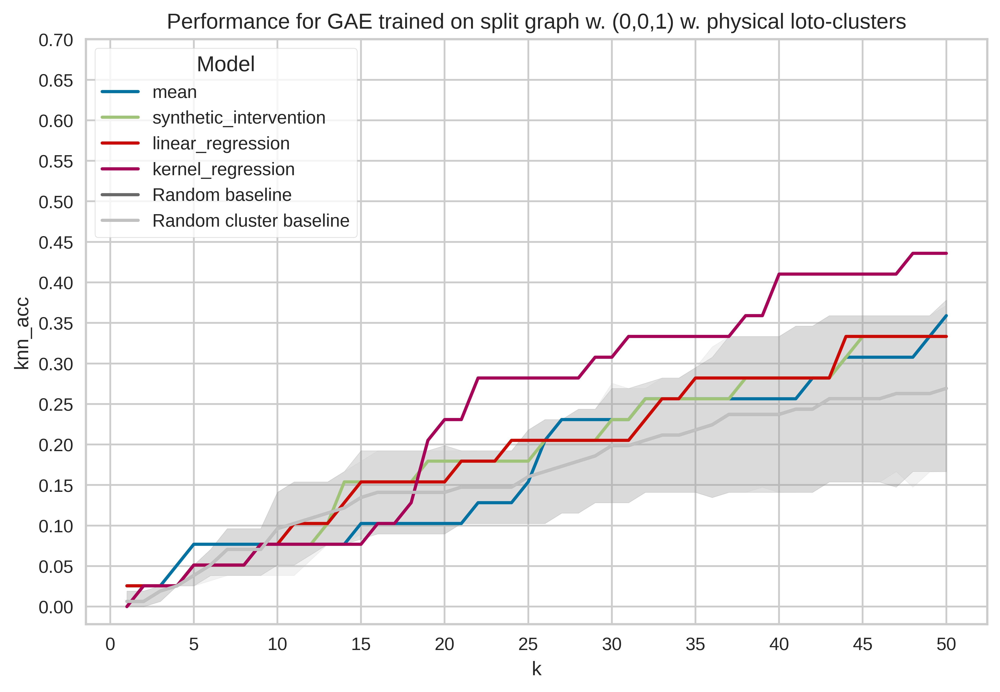

<IPython.core.display.Javascript object>

In [628]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (0,0,1) w. physical loto-clusters",
)
plt.show()

The plot above suggests suprisingly does not show any strong trend suggesting that a larger number of neighbors to consider is beneficial. Importantly, the performance reaches an accuracy roughly 2 times what would be expected by random chance for most $l$.

---

#### 2.1.b. Experiment 2

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (1,0,0)$ using the split graph and the physical loto-clusters.

In [820]:
gae_exp = "gae_exp_a1_b0_g0_split_graph_physical_4"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [821]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=0,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['NCOR2' 'MAP3K5' 'MAPK8' 'AKT1S1' 'BRAF']
[[-0.02655128 -0.022615   -0.00725393 ...  0.0137765  -0.01625791
   0.00491711]]
mean ATF4 ['MAP3K2' 'NCOR2' 'MAPK8' 'MAP3K5' 'AKT1S1']
[[ 0.01970352 -0.02048371 -0.01755682 ...  0.05188238 -0.05292448
  -0.0240287 ]]
mean BAX ['MAP3K2' 'MAP3K5' 'NCOR2' 'MAPK8' 'BRAF']
[[ 0.01550323 -0.02200083 -0.01968891 ...  0.04752986 -0.04903598
  -0.01842621]]
mean BCL2L11 ['MAP3K5' 'NCOR2' 'MAP3K2' 'BRAF' 'MAPK8']
[[ 0.01549332 -0.02094024 -0.01473675 ...  0.04976618 -0.04671425
  -0.02125834]]
mean BRAF ['MAP3K2' 'NCOR2' 'MAPK8' 'MAP3K5' 'AKT1S1']
[[ 0.01648161 -0.02002325 -0.01132059 ...  0.05391684 -0.04350864
  -0.01950246]]
mean CASP8 ['MAP3K5' 'TSC2' 'MAP3K2' 'MAPK8' 'RAF1']
[[ 0.01971889 -0.02255833 -0.02037746 ...  0.03981908 -0.05680346
  -0.01728253]]
mean CDC42 ['MAP3K2' 'NCOR2' 'TSC2' 'MAP3K5' 'MAPK8']
[[ 0.01768173 -0.02266892 -0.02526918 ...  0.04348736 -0.05823146
  -0.01257288]]
mean CDKN1A ['NCOR2' 'MAP3K2' 'MAPK8' 'MAP3K5'

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

ntk AKT1S1 ['TSC2' 'NCOR2' 'AKT1S1' 'MAP3K5' 'ELK1']
[[-0.01225847 -0.02050915 -0.00246329 ...  0.00567452 -0.00594394
   0.01046184]]
ntk ATF4 ['TSC2' 'MAP3K5' 'FOXO1' 'CEBPA' 'MAPK8']
[[ 0.00427972 -0.02076673 -0.01265649 ...  0.04340447 -0.04828243
  -0.02309785]]
ntk BAX ['TSC2' 'CEBPA' 'FOXO1' 'MAP3K5' 'NCOR2']
[[ 0.00408005 -0.01739339 -0.01091106 ...  0.0372671  -0.05697467
  -0.01234927]]
ntk BCL2L11 ['MAP3K5' 'BRAF' 'RAF1' 'CDK14' 'HSPA1B']
[[ 0.03688601 -0.03742456 -0.0206023  ...  0.05443358 -0.0363573
  -0.02626677]]
ntk BRAF ['HRAS' 'RAF1' 'BRAF' 'CDC42' 'PAK2']
[[ 0.03129116 -0.02148646 -0.00959014 ...  0.062515   -0.03664065
  -0.03732988]]
ntk CASP8 ['MAPK8' 'MAP3K2' 'PAK2' 'NCOR2' 'CEBPA']
[[-0.00123684 -0.01799767 -0.00952415 ...  0.04573182 -0.03224099
  -0.01807636]]
ntk CDC42 ['BRAF' 'RAF1' 'MAP3K5' 'PAK2' 'MAPK8']
[[ 0.0244787  -0.02293646 -0.02925707 ...  0.047712   -0.05450369
  -0.01927873]]
ntk CDKN1A ['MAP3K5' 'MAP3K2' 'TSC2' 'CEBPA' 'FOXO1']
[[ 0.00797288 -0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PTCH1' 'SMO' 'GLI1' 'RPS6KB1' 'NCF2']
[[ 4.46303080e-02 -1.43195204e-02 -2.33131148e-02 ...  4.01221823e-05
   2.83192463e-02  4.46863422e-02]]
synthetic_intervention ATF4 ['TSC2' 'MAP3K5' 'CEBPA' 'FOXO1' 'CDK14']
[[ 0.00340625 -0.01692337 -0.01879653 ...  0.04520507 -0.04077835
  -0.02189744]]
synthetic_intervention BAX ['PRKCE' 'FOXO1' 'BRAF' 'NCOR2' 'CEBPA']
[[ 0.02827622 -0.01493359 -0.01036307 ...  0.02748766 -0.07687041
  -0.00813761]]
synthetic_intervention BCL2L11 ['HSPA1B' 'MAP3K5' 'RAF1' 'TRAF2' 'HSP90AB1']
[[ 0.01360903 -0.06502107 -0.02190485 ...  0.02791499 -0.0215444
  -0.02262281]]
synthetic_intervention BRAF ['PRKCE' 'KRT18' 'CDC42' 'HRAS' 'BRAF']
[[ 0.0408571  -0.03334717 -0.01816867 ...  0.04359575 -0.0331714
  -0.03884245]]
synthetic_intervention CASP8 ['YES1' 'SRC' 'HRAS' 'LGALS1' 'PIK3R2']
[[ 0.00310645 -0.03294726  0.01705965 ...  0.04828605 -0.00120679
  -0.03412009]]
synthetic_intervention CDC42 ['BRAF' 'RAF1' 'MAP3K5' 'FKBP4' 'CD

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PTCH1' 'SMO' 'GLI1' 'RPS6KB1' 'NCF2']
[[ 0.04462873 -0.0144061  -0.02285652 ...  0.0001268   0.02879025
   0.04431172]]
linear_regression ATF4 ['TSC2' 'MAP3K5' 'CEBPA' 'FOXO1' 'CDK14']
[[ 0.0038259  -0.01666119 -0.01845294 ...  0.04534192 -0.0410149
  -0.02194074]]
linear_regression BAX ['PRKCE' 'FOXO1' 'NCOR2' 'BRAF' 'CEBPA']
[[ 0.02736526 -0.01524312 -0.0109907  ...  0.02786108 -0.07653332
  -0.00804498]]
linear_regression BCL2L11 ['HSPA1B' 'MAP3K5' 'TRAF2' 'RAF1' 'CDC42']
[[ 0.01612557 -0.0667326  -0.02125873 ...  0.0272156  -0.02136855
  -0.02369378]]
linear_regression BRAF ['PRKCE' 'KRT18' 'CDC42' 'HRAS' 'BRAF']
[[ 0.04008557 -0.03334403 -0.01861444 ...  0.0438011  -0.03332657
  -0.03853159]]
linear_regression CASP8 ['YES1' 'SRC' 'HRAS' 'LGALS1' 'PIK3R2']
[[ 0.00676887 -0.03456078  0.01879867 ...  0.04851503 -0.00215321
  -0.03570228]]
linear_regression CDC42 ['BRAF' 'RAF1' 'MAP3K5' 'CDK14' 'FKBP4']
[[ 0.01778102 -0.01485907 -0.03536447 ...  0.03768352 -

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['HRAS' 'LGALS1' 'NCOR2' 'AKT1S1' 'PRAME']
[[ 0.01569602 -0.02303305 -0.01080494 ...  0.02007369  0.00662389
   0.00619657]]
kernel_regression ATF4 ['HRAS' 'BRAF' 'RAF1' 'PAK2' 'AKT1S1']
[[ 0.02097941 -0.00541444 -0.01344032 ...  0.05461123 -0.0563327
  -0.03855091]]
kernel_regression BAX ['MBP' 'MAP3K2' 'AKT1S1' 'MAP3K5' 'TSC2']
[[ 0.01837622 -0.01673173 -0.01161014 ...  0.03400521 -0.04832536
  -0.01549008]]
kernel_regression BCL2L11 ['BRAF' 'RAF1' 'CDC42' 'PRKCE' 'KRT18']
[[ 0.03140603 -0.01914615 -0.01173359 ...  0.04998743 -0.04231162
  -0.03963841]]
kernel_regression BRAF ['BRAF' 'RAF1' 'PAK2' 'CDC42' 'PRKCE']
[[ 0.02267207 -0.01163139 -0.01318229 ...  0.05586724 -0.03588419
  -0.03964976]]
kernel_regression CASP8 ['MAPK8' 'CLU' 'MAP3K2' 'HRAS' 'RAF1']
[[ 0.02762468 -0.00714232 -0.01635401 ...  0.05047247 -0.03777967
  -0.02770979]]
kernel_regression CDC42 ['BRAF' 'PRKCE' 'RAF1' 'CDC42' 'KRT18']
[[ 0.04573912 -0.01378146 -0.02995763 ...  0.05193853 -0.046

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

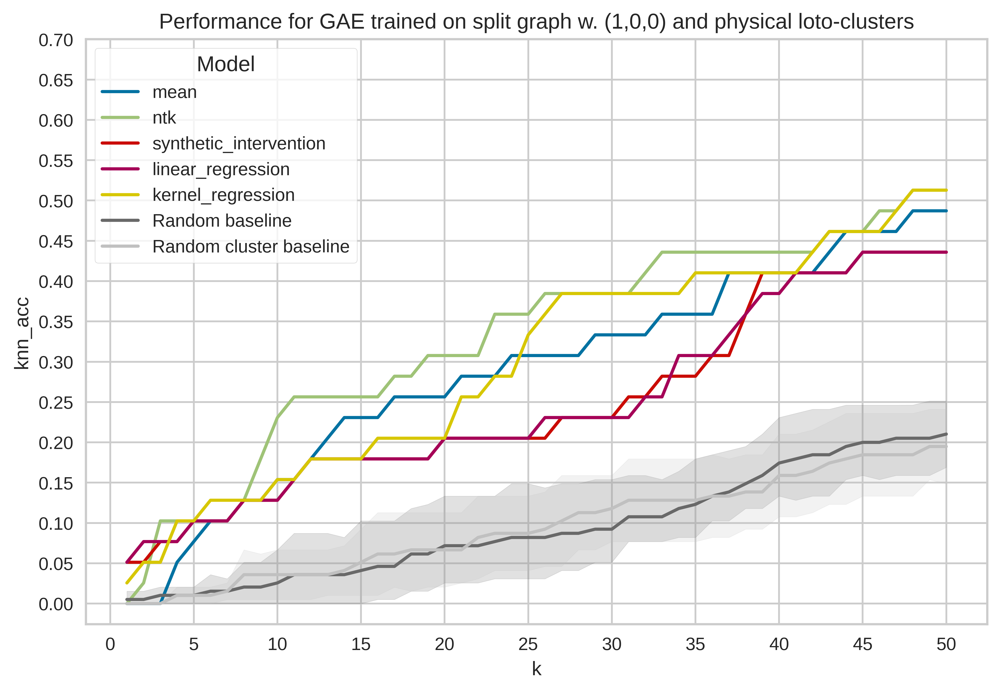

<IPython.core.display.Javascript object>

In [822]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,0) and physical loto-clusters",
)
plt.show()

In [823]:
mean_pred_dict_100 = get_nn_prediction_dict(
    reg_embs_dict=pert_reg_embs_dict["reg_embs"],
    pert_embs_dict=pert_reg_embs_dict["pert_embs"],
    model_type="mean",
    permute=False,
)

mean AKT1S1 ['NCOR2' 'MAP3K5' 'MAPK8' 'AKT1S1' 'BRAF']
[[-0.02655128 -0.022615   -0.00725393 ...  0.0137765  -0.01625791
   0.00491711]]
mean ATF4 ['MAP3K2' 'NCOR2' 'MAPK8' 'MAP3K5' 'AKT1S1']
[[ 0.01970352 -0.02048371 -0.01755682 ...  0.05188238 -0.05292448
  -0.0240287 ]]
mean BAX ['MAP3K2' 'MAP3K5' 'NCOR2' 'MAPK8' 'BRAF']
[[ 0.01550323 -0.02200083 -0.01968891 ...  0.04752986 -0.04903598
  -0.01842621]]
mean BCL2L11 ['MAP3K5' 'NCOR2' 'MAP3K2' 'BRAF' 'MAPK8']
[[ 0.01549332 -0.02094024 -0.01473675 ...  0.04976618 -0.04671425
  -0.02125834]]
mean BRAF ['MAP3K2' 'NCOR2' 'MAPK8' 'MAP3K5' 'AKT1S1']
[[ 0.01648161 -0.02002325 -0.01132059 ...  0.05391684 -0.04350864
  -0.01950246]]
mean CASP8 ['MAP3K5' 'TSC2' 'MAP3K2' 'MAPK8' 'RAF1']
[[ 0.01971889 -0.02255833 -0.02037746 ...  0.03981908 -0.05680346
  -0.01728253]]
mean CDC42 ['MAP3K2' 'NCOR2' 'TSC2' 'MAP3K5' 'MAPK8']
[[ 0.01768173 -0.02266892 -0.02526918 ...  0.04348736 -0.05823146
  -0.01257288]]
mean CDKN1A ['NCOR2' 'MAP3K2' 'MAPK8' 'MAP3K5'

<IPython.core.display.Javascript object>

In [824]:
mean_pred_dict_100

{'AKT1S1': array(['NCOR2', 'MAP3K5', 'MAPK8', 'AKT1S1', 'BRAF', 'MAP3K2', 'TSC2',
        'CEBPA', 'JUN', 'RAF1', 'ELK1', 'HRAS', 'PAK2', 'RARA', 'CDK14',
        'LDOC1', 'KRT18', 'FOXO1', 'FKBP4', 'PRKCE', 'CDC42', 'LGALS1',
        'S100A2', 'PIK3R2', 'MAGEA1', 'FOS', 'GSK3B', 'TNNT1', 'HSPB1',
        'CREB1', 'FHL2', 'NDN', 'THRA', 'RELB', 'BCR', 'SRC', 'MAGEA4',
        'PRAME', 'KPNA2', 'YWHAQ', 'CLU', 'DSP', 'RHOA', 'CRMP1', 'AQP1',
        'VIM', 'S100A14', 'HSP90AB1', 'UCHL5', 'MAGEA6', 'EPB41L3',
        'TRAF2', 'MAGED1', 'AXL', 'MAP2K3', 'CD40', 'HSPA1B', 'ATF4',
        'CDC42EP1', 'YES1', 'MYC', 'SFN', 'KRT80', 'NEFL', 'SREBF1',
        'PDGFRB', 'CCND2', 'TUBA1A', 'SMAD4', 'E2F1', 'KRT15', 'TCF4',
        'PLCG1', 'TUBB6', 'BAX', 'KRT8', 'GIT1', 'MCM5', 'RUNX1', 'MSH2',
        'EXO1', 'LZTS2', 'HK2', 'TONSL', 'TK1', 'PRKACA', 'CDKN1A', 'TUBB',
        'CDK6', 'ARMCX2', 'PCLO', 'MDFI', 'MAGEA12', 'EFEMP1', 'MCM4',
        'MCM3', 'KRT81', 'MAPK7', 'MCM7', 'TUBB2B', 'MDC

<IPython.core.display.Javascript object>

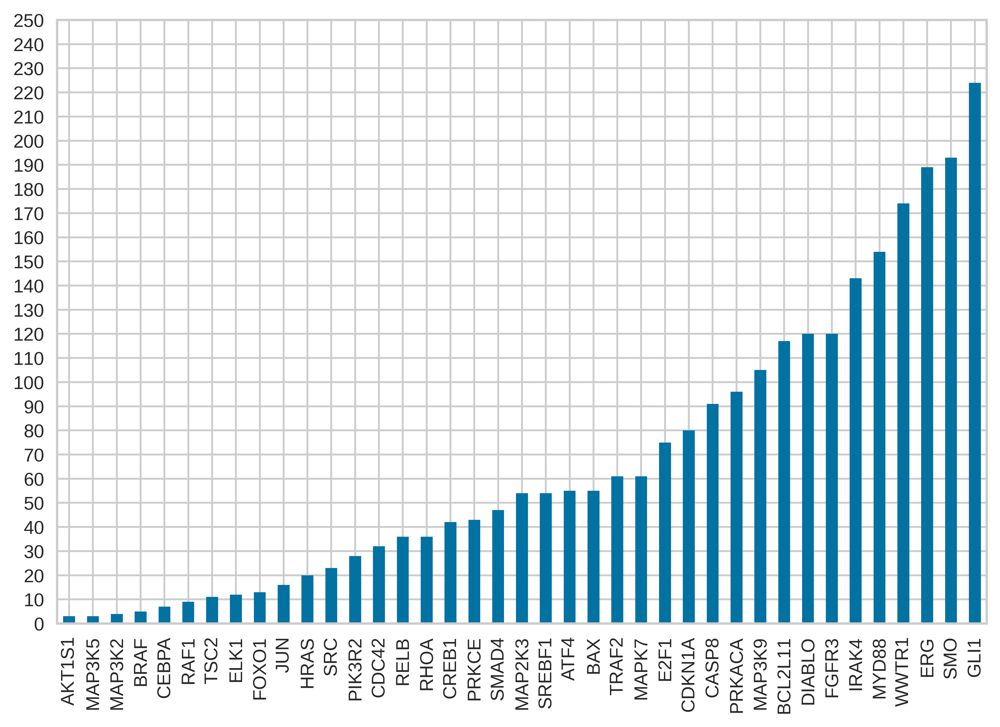

<IPython.core.display.Javascript object>

In [825]:
nn_mean_hit_na_dict = get_knn_hit_data(mean_pred_dict_100)
ax = nn_mean_hit_na_dict.knn_hit.sort_values().plot(kind="bar", figsize=[9, 6])
# ax.set_ylabel("k-neighbors")
# ax.set_title("Number of neighbors until target")
ax.set_yticks(range(0, 260, 10))
plt.show()

---

#### 2.1.c. Experiment 3

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (1,0,1)$ using the split graph and physical loto-clusters.

In [826]:
gae_exp = "gae_exp_a1_b0_g1_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [827]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=1,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'LDOC1' 'KRT18' 'NCOR2' 'GSK3B']
[[ 0.0474701  -0.0068473  -0.00691632 ...  0.00234533 -0.04356011
  -0.02516803]]
mean ATF4 ['FOXO1' 'RARA' 'AKT1S1' 'TSC2' 'RELB']
[[ 0.01492087 -0.04281835  0.0020635  ...  0.00474146 -0.02531846
  -0.02390462]]
mean BAX ['HSPA1B' 'YES1' 'RHOA' 'BCR' 'TSC2']
[[-0.01150317 -0.01107682  0.01851883 ...  0.01188897 -0.02677615
  -0.01353481]]
mean BCL2L11 ['MAP3K5' 'HSPA1B' 'PIK3R2' 'AXL' 'RHOA']
[[ 0.05250243 -0.02466731  0.0181079  ...  0.03273555 -0.05221695
  -0.02585766]]
mean BRAF ['FOXO1' 'SRC' 'AKT1S1' 'MAP3K5' 'SREBF1']
[[ 0.02217941  0.00385547  0.00955795 ...  0.03038557 -0.04339359
  -0.0167734 ]]
mean CASP8 ['RARA' 'FOXO1' 'GSK3B' 'TSC2' 'PRAME']
[[-0.01206836  0.01262659  0.00854626 ...  0.02517633 -0.00750653
  -0.01037286]]
mean CDC42 ['HSPA1B' 'MAP3K5' 'RHOA' 'MBP' 'SRC']
[[-0.01667359 -0.01753669 -0.00259718 ...  0.0369473  -0.01469497
   0.00189431]]
mean CDKN1A ['HSPA1B' 'TSC2' 'BCR' 'RHOA' 'RELB']
[[ 0.03008097  0.

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

ntk AKT1S1 ['RARA' 'PRAME' 'FOXO1' 'TLR4' 'MYD88']
[[ 0.0204426  -0.02160227 -0.0304404  ...  0.05904416 -0.01551981
  -0.00633262]]
ntk ATF4 ['FOXO1' 'TSC2' 'FHL2' 'GSK3B' 'SMAD4']
[[-0.01002346 -0.04257104  0.00401282 ...  0.01611003 -0.00805867
  -0.02157302]]
ntk BAX ['TSC2' 'FHL2' 'CREB1' 'SMAD4' 'GSK3B']
[[-0.0328341  -0.01719231  0.00588603 ...  0.04130977 -0.02881308
   0.01218171]]
ntk BCL2L11 ['TRAF2' 'CD40' 'EFEMP1' 'CDC42EP1' 'CDC42']
[[ 0.05444001 -0.01821318  0.0204306  ...  0.02219855 -0.04747074
  -0.00772561]]
ntk BRAF ['PRKCE' 'RAF1' 'PDGFRB' 'SRC' 'CDC42']
[[ 0.03954164 -0.01721661 -0.00150042 ...  0.00628647 -0.0253577
  -0.03396532]]
ntk CASP8 ['BCL2L11' 'MAGEA11' 'SFN' 'BRAF' 'RAF1']
[[-0.01006465  0.00241734  0.01323979 ... -0.00609843  0.03197254
  -0.0251884 ]]
ntk CDC42 ['PRKCE' 'RAF1' 'MAP3K2' 'SRC' 'MAP3K5']
[[-0.00811303 -0.0246892  -0.01816011 ...  0.00699269 -0.00916982
  -0.01929607]]
ntk CDKN1A ['MAP3K5' 'SFN' 'MBP' 'MAP3K2' 'MAGEA1']
[[ 0.00492355  0.0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'SMO' 'PTCH1']
[[ 0.01909906 -0.02831095 -0.02103238 ...  0.07270971  0.00882546
   0.01013595]]
synthetic_intervention ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'RELB']
[[-0.01100265 -0.05248258 -0.00668226 ...  0.01649413 -0.01209453
  -0.02810951]]
synthetic_intervention BAX ['FHL2' 'TSC2' 'GSK3B' 'FOXO1' 'CREB1']
[[-0.03935118  0.00134616  0.00693105 ...  0.02770115 -0.00223504
   0.02149905]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'CDCA3']
[[ 0.01396335  0.02489764  0.0444069  ...  0.02231259 -0.01866334
   0.00945749]]
synthetic_intervention BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.04318419 -0.01923977 -0.00243393 ...  0.00231028 -0.0116009
  -0.03536587]]
synthetic_intervention CASP8 ['BRAF' 'HRAS' 'RAF1' 'MAGEA11' 'SRC']
[[-0.00586698 -0.00812079  0.02942177 ... -0.00576002  0.00984953
  -0.01339115]]
synthetic_intervention CDC42 ['PRKCE' 'RAF1' 'KRT18' 'MAP3K2' 'MAPK8']
[[ 0.02661791 -0.0253445

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'SMO' 'PTCH1']
[[ 0.01911387 -0.0284172  -0.02122938 ...  0.0728517   0.00912807
   0.01034611]]
linear_regression ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'RELB']
[[-0.01112899 -0.05292974 -0.00676538 ...  0.01626585 -0.01194535
  -0.02834513]]
linear_regression BAX ['FHL2' 'TSC2' 'GSK3B' 'FOXO1' 'CREB1']
[[-0.03929243  0.00180153  0.0067744  ...  0.02839397 -0.00180803
   0.02193038]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'CDCA3']
[[ 0.01286101  0.0233778   0.04310599 ...  0.02257014 -0.0183223
   0.00787266]]
linear_regression BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.04320129 -0.01911111 -0.00265987 ...  0.00229309 -0.01140189
  -0.03542613]]
linear_regression CASP8 ['BRAF' 'HRAS' 'RAF1' 'SRC' 'MAGEA11']
[[-0.0063509  -0.00993363  0.02968848 ... -0.00254977  0.00991345
  -0.01179636]]
linear_regression CDC42 ['PRKCE' 'RAF1' 'KRT18' 'MAP3K2' 'MAPK8']
[[ 0.02665551 -0.02468428 -0.01768304 ... -0.00213657  0.00

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['TLR4' 'SMO' 'PTCH1' 'MYD88' 'FOXO1']
[[ 0.01798689 -0.02381419 -0.034403   ...  0.05262866 -0.00777992
  -0.01060179]]
kernel_regression ATF4 ['MBP' 'IRAK4' 'PIK3R2' 'KRT18' 'SRC']
[[ 0.01684451 -0.05007827  0.01378551 ...  0.03099829 -0.00889318
  -0.01923324]]
kernel_regression BAX ['SMAD4' 'IRAK4' 'CREB1' 'TSC2' 'GLI2']
[[-0.03175395 -0.038611   -0.00775871 ...  0.04909729 -0.04051618
   0.00829455]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'AXL' 'SRC' 'RAF1']
[[ 0.04201915 -0.02200188 -0.00488571 ...  0.0155354  -0.0288194
  -0.03575327]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'BRAF' 'SRC' 'PDGFRB']
[[ 0.04195065 -0.01385586 -0.00028263 ...  0.00798029 -0.020007
  -0.02991563]]
kernel_regression CASP8 ['BRAF' 'RAF1' 'KRT18' 'PAK2' 'MAGEA11']
[[ 0.00886441 -0.01396044 -0.00644068 ...  0.01589415  0.03608522
  -0.02113071]]
kernel_regression CDC42 ['PRKCE' 'DSP' 'MAP3K5' 'MAP3K2' 'SRC']
[[-0.00653076 -0.03717278 -0.0197272  ...  0.00138338 -0.00297309
  

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

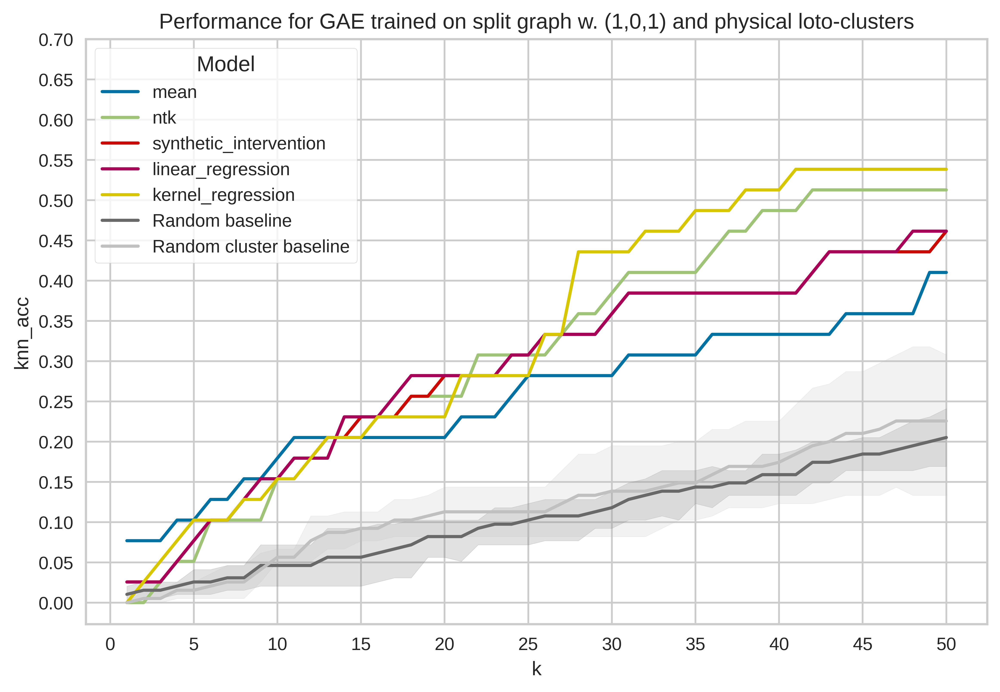

<IPython.core.display.Javascript object>

In [828]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,1) and physical loto-clusters",
)
plt.show()

<AxesSubplot:xlabel='k', ylabel='knn_acc'>

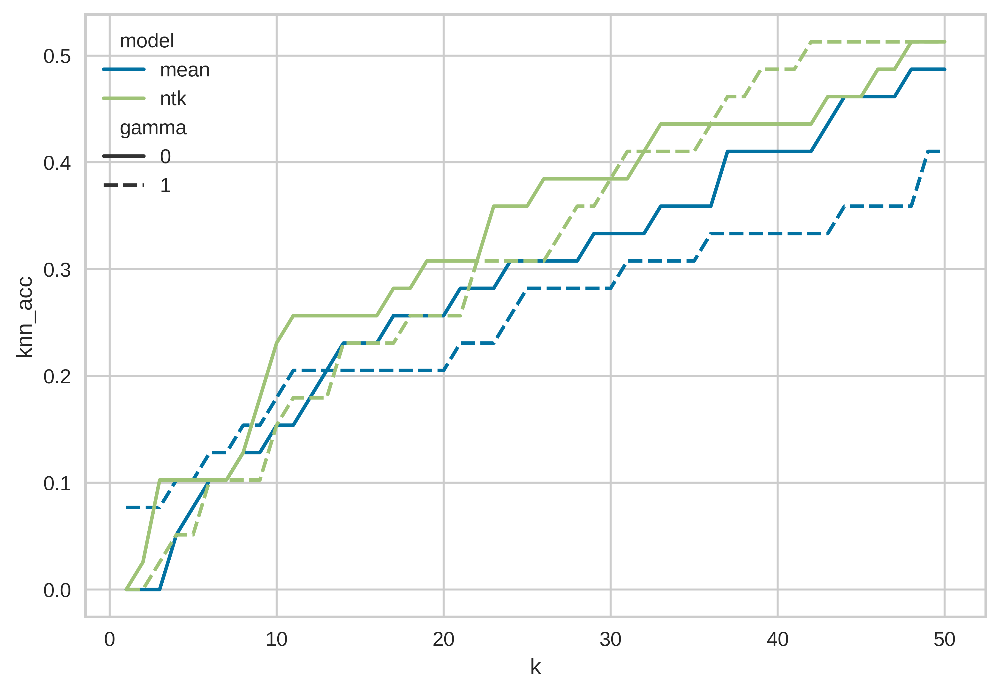

<IPython.core.display.Javascript object>

In [829]:
tmp = knn_acc_results_dict["gae_exp_a1_b0_g1_split_graph_physical"][
    "knn_results"
].append(knn_acc_results_dict["gae_exp_a1_b0_g0_split_graph_physical_4"]["knn_results"])
sns.lineplot(
    data=tmp.loc[tmp.model.isin(["ntk", "mean"])],
    x="k",
    y="knn_acc",
    hue="model",
    style="gamma",
)

---

#### 2.1.d. Experiment 4

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (1,0,2)$ using the split graph and physical loto-clusters.

In [548]:
gae_exp = "gae_exp_a1_b0_g2_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [549]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=2,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'NCOR2' 'SRC' 'PIK3R2' 'RARA']
[[ 0.05044202 -0.02055609 -0.00997544 ...  0.02345103 -0.04208367
  -0.02712331]]
mean ATF4 ['RARA' 'FOXO1' 'TSC2' 'AKT1S1' 'PRAME']
[[ 0.01756956 -0.04758964 -0.00455551 ...  0.00120371 -0.03676883
  -0.00845236]]
mean BAX ['TSC2' 'MAPK8' 'FOXO1' 'NCOR2' 'RARA']
[[ 0.00481134 -0.01844406  0.02687219 ...  0.00674056 -0.02673484
  -0.00780338]]
mean BCL2L11 ['PIK3R2' 'AXL' 'HSPA1B' 'MAP3K5' 'SRC']
[[ 0.04275938 -0.02136019  0.02131002 ...  0.03263638 -0.04963747
  -0.03747963]]
mean BRAF ['SREBF1' 'AKT1S1' 'SRC' 'FOXO1' 'TLR4']
[[ 0.00970632  0.00152369  0.00986485 ...  0.03110778 -0.05272481
  -0.01929277]]
mean CASP8 ['RARA' 'FOXO1' 'TLR4' 'YES1' 'MYD88']
[[-0.02523197  0.02045527  0.01391862 ...  0.01714045 -0.00631659
  -0.01933092]]
mean CDC42 ['TSC2' 'FOXO1' 'RHOA' 'MAP3K5' 'SRC']
[[-0.01228253 -0.01359786  0.01120109 ...  0.03526352 -0.02605406
  -0.00337206]]
mean CDKN1A ['HSPA1B' 'KPNA2' 'RELB' 'TSC2' 'BCR']
[[ 0.02788795 -0.00

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'EFEMP1' 'RARA']
[[ 0.01947143 -0.03469509 -0.02201789 ...  0.07274596  0.01062848
   0.00833261]]
synthetic_intervention ATF4 ['FOXO1' 'TSC2' 'SMAD4' 'GSK3B' 'RELB']
[[-0.0170748  -0.04806455 -0.01022158 ...  0.01827918 -0.02762495
  -0.01526968]]
synthetic_intervention BAX ['TSC2' 'FOXO1' 'NCOR2' 'CEBPA' 'RARA']
[[ 0.00358858 -0.0173011   0.01564095 ...  0.02321289 -0.01160721
   0.01617355]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'EFEMP1' 'TRAF2' 'CDCA3']
[[ 0.00798119  0.03175186  0.04133068 ...  0.01732014 -0.02638108
   0.00311955]]
synthetic_intervention BRAF ['PRKCE' 'PDGFRB' 'CDC42' 'SRC' 'RAF1']
[[ 0.03800475 -0.02429285 -0.00023663 ...  0.00599517 -0.02051453
  -0.03715683]]
synthetic_intervention CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'RAF1' 'BCL2L11']
[[-0.02035684 -0.01104933  0.02895812 ... -0.0128179   0.00025052
  -0.01301922]]
synthetic_intervention CDC42 ['MAPK8' 'KRT18' 'RAF1' 'MAP3K2' 'BRAF']
[[ 0.01110848 -0.

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'EFEMP1' 'RARA']
[[ 0.01942954 -0.03476208 -0.02227179 ...  0.0728561   0.01092236
   0.00850007]]
linear_regression ATF4 ['FOXO1' 'TSC2' 'SMAD4' 'GSK3B' 'RELB']
[[-0.01708186 -0.04847859 -0.01029395 ...  0.01822109 -0.02760668
  -0.01545418]]
linear_regression BAX ['TSC2' 'FOXO1' 'NCOR2' 'CEBPA' 'RARA']
[[ 0.00392208 -0.01665815  0.01566418 ...  0.02389168 -0.01156843
   0.01612579]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'EFEMP1' 'TRAF2' 'CDCA3']
[[ 0.00760552  0.03025268  0.04033094 ...  0.0178945  -0.02626889
   0.00194942]]
linear_regression BRAF ['PRKCE' 'PDGFRB' 'CDC42' 'SRC' 'RAF1']
[[ 0.03788706 -0.02415751 -0.00048342 ...  0.00599023 -0.0203742
  -0.03729886]]
linear_regression CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'SRC' 'RAF1']
[[-0.02074394 -0.01241609  0.02922706 ... -0.00910342  0.00022984
  -0.01116849]]
linear_regression CDC42 ['KRT18' 'MAPK8' 'RAF1' 'MAP3K2' 'BRAF']
[[ 0.01108877 -0.01711483 -0.0104522  ...  0.01445749 -0.

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['TLR4' 'SMO' 'PTCH1' 'PRAME' 'FOXO1']
[[ 0.01898925 -0.02961345 -0.03520405 ...  0.05893128 -0.00572708
  -0.00903009]]
kernel_regression ATF4 ['SRC' 'MBP' 'FOXO1' 'TSC2' 'FHL2']
[[ 0.01544135 -0.05205223  0.01114098 ...  0.02124148 -0.01614843
  -0.01661542]]
kernel_regression BAX ['AKT1S1' 'FOXO1' 'TSC2' 'SMAD4' 'SRC']
[[-0.02740057 -0.03103969  0.01735647 ...  0.00648704 -0.0402192
  -0.00395767]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'SRC' 'AXL' 'RAF1']
[[ 0.03493467 -0.02200018  0.00054195 ...  0.01658973 -0.02820176
  -0.04480163]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'SRC' 'PDGFRB' 'BRAF']
[[ 0.03129573 -0.01939976  0.00134582 ...  0.01099731 -0.0291734
  -0.03463277]]
kernel_regression CASP8 ['BRAF' 'RAF1' 'KRT18' 'PAK2' 'MAGEA11']
[[-0.00605702 -0.02170884 -0.00928213 ...  0.0076561   0.02804627
  -0.02634661]]
kernel_regression CDC42 ['MAP3K5' 'MAP3K2' 'PRKCE' 'MAP2K3' 'RAF1']
[[-0.01886095 -0.02643889 -0.00740928 ...  0.01383972 -0.01315106


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

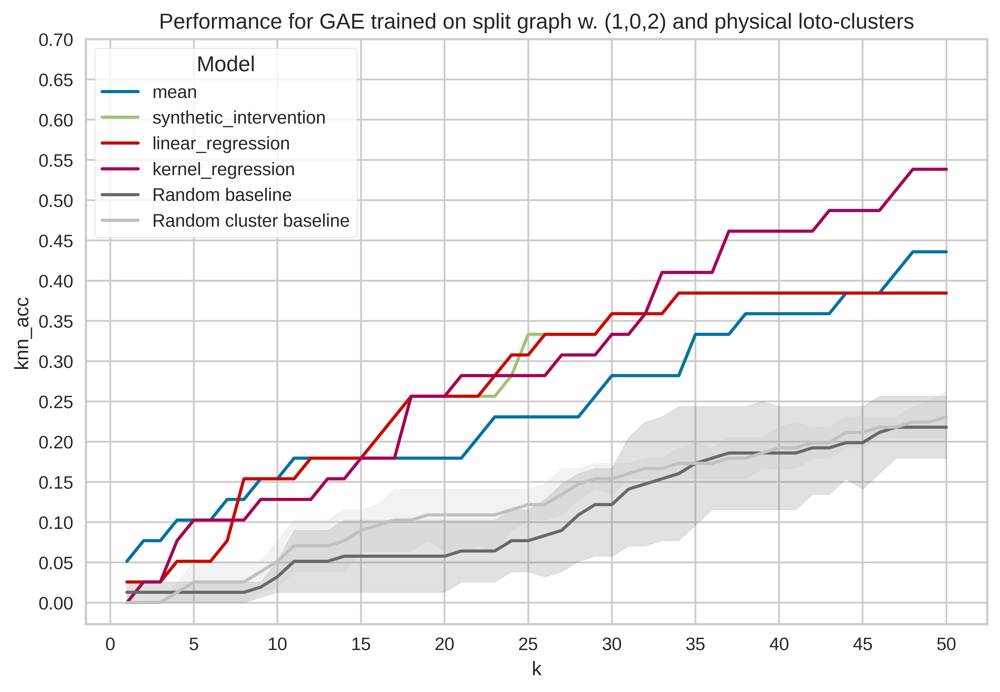

<IPython.core.display.Javascript object>

In [550]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,2) and physical loto-clusters",
)
plt.show()

---

#### 2.1.e. Experiment 5

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (1,0,5)$ using the split graph and physical loto-clusters.

In [551]:
gae_exp = "gae_exp_a1_b0_g5_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [552]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=5,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'TSC2' 'SRC' 'FHL2' 'KRT18']
[[ 0.04912324 -0.04222265 -0.01847146 ...  0.01784156 -0.02621521
  -0.02215575]]
mean ATF4 ['TLR4' 'SREBF1' 'RELB' 'AKT1S1' 'FOXO1']
[[ 0.00689712 -0.06946919  0.01447064 ...  0.00509505 -0.03909684
  -0.02971361]]
mean BAX ['YES1' 'RHOA' 'BCR' 'ALOX5' 'WWTR1']
[[-0.02005319 -0.02231932  0.01550112 ...  0.01570063 -0.02619851
  -0.01152503]]
mean BCL2L11 ['TLR4' 'SRC' 'RARA' 'AXL' 'PIK3R2']
[[ 0.03346024 -0.03133915  0.01083905 ...  0.02945235 -0.040915
  -0.03194795]]
mean BRAF ['TLR4' 'SREBF1' 'SRC' 'AKT1S1' 'CDC42EP1']
[[ 0.01605388 -0.00454442  0.01919598 ...  0.03058827 -0.04345813
  -0.02386018]]
mean CASP8 ['TLR4' 'MYD88' 'IRF7' 'SREBF1' 'PRKACA']
[[-0.03643181  0.02212939  0.02307366 ...  0.03128886 -0.00371367
  -0.0135017 ]]
mean CDC42 ['HSPA1B' 'TLR4' 'RHOA' 'MYD88' 'MBP']
[[-0.03290156 -0.02634264  0.00156188 ...  0.04925487 -0.02042068
  -0.00173302]]
mean CDKN1A ['HSPA1B' 'KPNA2' 'BCR' 'RELB' 'TLR4']
[[ 0.02690973 -0.01551

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PRAME' 'CD40' 'EFEMP1' 'DIABLO' 'RARA']
[[ 0.01803335 -0.0439684  -0.02369609 ...  0.06914942  0.00918224
   0.00475721]]
synthetic_intervention ATF4 ['FOXO1' 'FHL2' 'TSC2' 'SMAD4' 'MYD88']
[[-0.01671474 -0.06525124 -0.0079569  ...  0.02131848 -0.0356433
  -0.0296279 ]]
synthetic_intervention BAX ['GSK3B' 'FHL2' 'TSC2' 'CREB1' 'FOXO1']
[[-0.04813196  0.00221956  0.00067249 ...  0.02169485 -0.0018346
   0.02147667]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'EFEMP1' 'TRAF2' 'PRAME']
[[ 0.00896683  0.02611411  0.03314073 ...  0.02151237 -0.03889878
  -0.00189619]]
synthetic_intervention BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.0433214  -0.03195667  0.00280908 ...  0.00887778 -0.01752087
  -0.03973737]]
synthetic_intervention CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'RAF1' 'BCL2L11']
[[-0.02985345 -0.01738263  0.02893583 ... -0.00153129 -0.00128427
  -0.002207  ]]
synthetic_intervention CDC42 ['PRKCE' 'RAF1' 'HK2' 'PDGFRB' 'MAPK8']
[[ 0.02998962 -0.040

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PRAME' 'CD40' 'EFEMP1' 'DIABLO' 'RARA']
[[ 0.01795133 -0.04405105 -0.02395053 ...  0.06927443  0.00951624
   0.00494497]]
linear_regression ATF4 ['FOXO1' 'FHL2' 'TSC2' 'SMAD4' 'MYD88']
[[-0.01658799 -0.06550661 -0.00779961 ...  0.02127411 -0.03552219
  -0.02990534]]
linear_regression BAX ['GSK3B' 'FHL2' 'TSC2' 'CREB1' 'FOXO1']
[[-0.04803016  0.00256428  0.00023212 ...  0.02196387 -0.00124131
   0.02185438]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'EFEMP1' 'TRAF2' 'PRAME']
[[ 0.00912516  0.0249928   0.03220908 ...  0.02074313 -0.03839431
  -0.0020384 ]]
linear_regression BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.04329034 -0.03195528  0.0026062  ...  0.00888015 -0.01720605
  -0.03993887]]
linear_regression CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'RAF1' 'SRC']
[[-2.9684862e-02 -1.8579585e-02  2.9374026e-02 ...  2.3026762e-03
  -5.9110520e-04 -6.1961946e-05]]
linear_regression CDC42 ['PRKCE' 'RAF1' 'HK2' 'PDGFRB' 'MAPK8']
[[ 0.03013228 -0.0397412  -0.00245182 .

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['SMO' 'TLR4' 'PTCH1' 'PRAME' 'FOXO1']
[[ 0.02004771 -0.04108107 -0.03539334 ...  0.05255824 -0.00546831
  -0.00933325]]
kernel_regression ATF4 ['MBP' 'PRKCA' 'IRAK4' 'SRC' 'NCAM1']
[[ 0.01505301 -0.05502875  0.01380939 ...  0.02775515 -0.00752983
  -0.02384944]]
kernel_regression BAX ['CREB1' 'SMAD4' 'TENM3' 'IRAK4' 'FHL2']
[[-0.02880019 -0.03840212 -0.01747585 ...  0.05263081 -0.03329727
   0.00429906]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'AXL' 'PLCG1' 'RHOA']
[[ 0.03244403 -0.02570401 -0.00315176 ...  0.01260983 -0.0295328
  -0.03405627]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'PDGFRB' 'SRC' 'CDC42']
[[ 0.03657462 -0.03120624  0.00854384 ...  0.01401639 -0.02236825
  -0.04264743]]
kernel_regression CASP8 ['BRAF' 'RAF1' 'KRT18' 'PAK2' 'MAGEA11']
[[-0.01918198 -0.02933847 -0.00863863 ...  0.01499649  0.02404094
  -0.02373364]]
kernel_regression CDC42 ['PRKCE' 'PDGFRB' 'SRC' 'HK2' 'DSP']
[[ 0.00073895 -0.05153747 -0.00391685 ...  0.00974318 -0.02122377


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

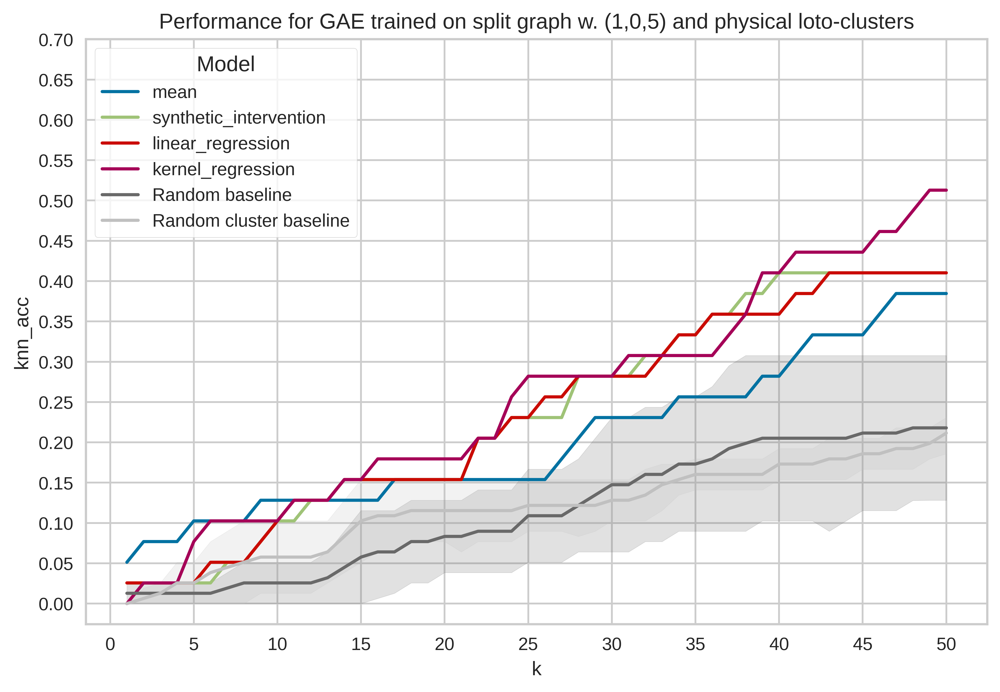

<IPython.core.display.Javascript object>

In [553]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,5) and physical loto-clusters",
)
plt.show()

---

#### 2.1.f. Experiment 6

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (1,1,1)$ using the split graph and physical loto-clusters.

In [554]:
gae_exp = "gae_exp_a1_b1_g1_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [555]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=1,
        gamma=1,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'SRC' 'NCOR2' 'KRT18' 'LDOC1']
[[ 0.05189594 -0.01347736 -0.00836587 ...  0.00930457 -0.04342031
  -0.02372827]]
mean ATF4 ['FOXO1' 'TSC2' 'RARA' 'SREBF1' 'AKT1S1']
[[ 0.00813715 -0.04749912  0.00284638 ...  0.00176878 -0.03337143
  -0.01837708]]
mean BAX ['RHOA' 'TSC2' 'HSPA1B' 'YES1' 'TLR4']
[[-0.01858875 -0.02546548  0.00931321 ...  0.00997869 -0.03503612
  -0.00899208]]
mean BCL2L11 ['MAP3K5' 'HSPA1B' 'AXL' 'RHOA' 'BCR']
[[ 0.04735281 -0.02339399  0.01632308 ...  0.03486445 -0.0464591
  -0.02218148]]
mean BRAF ['FOXO1' 'TSC2' 'MAP3K5' 'SRC' 'AKT1S1']
[[ 0.01239009 -0.00116198  0.00869045 ...  0.03820578 -0.05052722
  -0.00941794]]
mean CASP8 ['RARA' 'FOXO1' 'GSK3B' 'TSC2' 'S100A2']
[[-0.00993334  0.0114572  -0.00369739 ...  0.02086257 -0.0147748
  -0.00686427]]
mean CDC42 ['HSPA1B' 'MAP3K5' 'RHOA' 'TSC2' 'SRC']
[[-0.01717845 -0.02328853 -0.00284876 ...  0.04331879 -0.01600287
   0.00923988]]
mean CDKN1A ['HSPA1B' 'BCR' 'RHOA' 'KPNA2' 'TSC2']
[[ 0.02134017 -0.004

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'PTCH1' 'SMO']
[[ 0.01819904 -0.02677612 -0.02254077 ...  0.07426447  0.00998927
   0.00728286]]
synthetic_intervention ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'GSK3B']
[[-0.01407649 -0.05183178 -0.00984837 ...  0.01420153 -0.01651608
  -0.02460253]]
synthetic_intervention BAX ['FHL2' 'TSC2' 'GSK3B' 'CREB1' 'SMAD4']
[[-0.04110037 -0.00411668 -0.0005101  ...  0.02571937 -0.00245721
   0.02490729]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'CDCA3']
[[ 0.01778587  0.02589494  0.04577378 ...  0.02116955 -0.01603167
   0.00496911]]
synthetic_intervention BRAF ['PRKCE' 'SRC' 'CDC42' 'PDGFRB' 'RAF1']
[[ 0.04765036 -0.03795355  0.00052583 ...  0.00418592 -0.01798268
  -0.03220119]]
synthetic_intervention CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'RAF1' 'BCL2L11']
[[-0.00449142 -0.01405834  0.02849899 ... -0.00516588 -0.00077272
  -0.01280755]]
synthetic_intervention CDC42 ['PRKCE' 'RAF1' 'PAK2' 'KRT18' 'BRAF']
[[ 0.04297051 -0.0255

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'PTCH1' 'SMO']
[[ 0.01826202 -0.02682939 -0.02269784 ...  0.07446472  0.01027318
   0.00740641]]
linear_regression ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'GSK3B']
[[-0.01422152 -0.05228907 -0.00986409 ...  0.01403224 -0.01635637
  -0.02485764]]
linear_regression BAX ['FHL2' 'TSC2' 'GSK3B' 'CREB1' 'SMAD4']
[[-0.04088959 -0.00370116 -0.00075943 ...  0.02633246 -0.00205481
   0.0251896 ]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'CDCA3']
[[ 0.01649159  0.02456072  0.04444499 ...  0.0215283  -0.01593657
   0.00389779]]
linear_regression BRAF ['PRKCE' 'SRC' 'CDC42' 'PDGFRB' 'RAF1']
[[ 0.04768438 -0.03775718  0.00019427 ...  0.00425265 -0.0178098
  -0.0322194 ]]
linear_regression CASP8 ['BRAF' 'HRAS' 'RAF1' 'MAGEA11' 'SRC']
[[-0.00558477 -0.01659161  0.02932121 ... -0.00232588 -0.00099201
  -0.01092048]]
linear_regression CDC42 ['PRKCE' 'RAF1' 'PAK2' 'KRT18' 'BRAF']
[[ 0.04274123 -0.02477152 -0.00575165 ...  0.00335872  0.0009

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['TLR4' 'SMO' 'PTCH1' 'FOXO1' 'PRAME']
[[ 0.01817352 -0.02593754 -0.03331177 ...  0.0559829  -0.00701729
  -0.01100094]]
kernel_regression ATF4 ['MBP' 'IRAK4' 'KRT18' 'PIK3R2' 'SRC']
[[ 0.01066136 -0.05052145  0.01429332 ...  0.02557015 -0.0139365
  -0.0165798 ]]
kernel_regression BAX ['IRAK4' 'CREB1' 'SMAD4' 'GLI2' 'TSC2']
[[-0.0348815  -0.04601795 -0.01333129 ...  0.04429906 -0.0423078
   0.00980171]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'AXL' 'SRC' 'RHOA']
[[ 0.03885341 -0.02019012 -0.00555576 ...  0.01721458 -0.02393464
  -0.02971495]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'BRAF' 'PAK2' 'SRC']
[[ 0.04771044 -0.0345066   0.00129003 ...  0.01008069 -0.02518221
  -0.02601485]]
kernel_regression CASP8 ['RAF1' 'BRAF' 'KRT18' 'PAK2' 'MAGEA11']
[[ 0.01183093 -0.01789532 -0.01537519 ...  0.01548714  0.02913352
  -0.01928681]]
kernel_regression CDC42 ['PRKCE' 'RAF1' 'SRC' 'PDGFRB' 'DSP']
[[ 0.00635104 -0.04008247 -0.01416783 ...  0.00804931 -0.00715298
  -0.

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

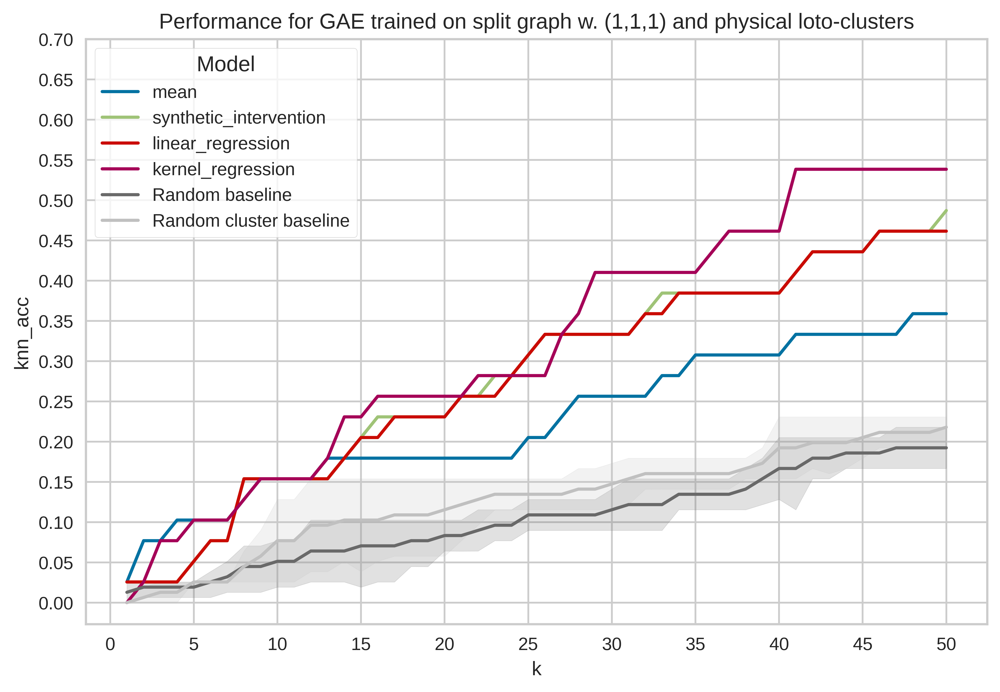

<IPython.core.display.Javascript object>

In [556]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,1,1) and physical loto-clusters",
)
plt.show()

---

#### 2.1.g. Experiment 7

In this experiment the GAE was trained using $(\alpha, \beta,\gamma) = (1,2,1)$ using the split graph and physical loto-clusters.

In [557]:
gae_exp = "gae_exp_a1_b2_g1_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [558]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=2,
        gamma=1,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'NCOR2' 'LDOC1' 'SRC' 'KRT18']
[[ 0.04055764 -0.01568586 -0.00631594 ...  0.01129761 -0.03782121
  -0.01239211]]
mean ATF4 ['TSC2' 'MAP3K5' 'MAPK8' 'NCOR2' 'FOXO1']
[[ 0.01223191 -0.03202935  0.0043142  ...  0.00410729 -0.02485579
  -0.01118149]]
mean BAX ['HSPA1B' 'RHOA' 'YES1' 'TSC2' 'BCR']
[[-0.01227239 -0.02253199  0.01755807 ...  0.01145429 -0.03396519
  -0.00484418]]
mean BCL2L11 ['MAP3K5' 'SRC' 'AXL' 'HSPA1B' 'PIK3R2']
[[ 0.04412498 -0.02226889  0.00718378 ...  0.02623114 -0.03331086
  -0.01542002]]
mean BRAF ['FOXO1' 'SRC' 'AKT1S1' 'MAP3K5' 'SREBF1']
[[ 0.01798197 -0.0077452   0.00663052 ...  0.03180276 -0.03706997
  -0.00551592]]
mean CASP8 ['RARA' 'FOXO1' 'TSC2' 'GSK3B' 'PRAME']
[[-0.01984879  0.01647758  0.00691051 ...  0.01001072 -0.01541188
  -0.00987629]]
mean CDC42 ['HSPA1B' 'MAP3K5' 'MBP' 'RHOA' 'TSC2']
[[-0.0287402  -0.02433989 -0.00524314 ...  0.03519728 -0.03073759
   0.01217128]]
mean CDKN1A ['HSPA1B' 'TSC2' 'RARA' 'RHOA' 'RELB']
[[ 0.02105964 -0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'PTCH1' 'SMO']
[[ 0.01468091 -0.03401626 -0.02041273 ...  0.06974154  0.01360163
   0.01576071]]
synthetic_intervention ATF4 ['TSC2' 'FOXO1' 'GSK3B' 'MAP3K5' 'S100A2']
[[ 0.00100979 -0.02674513  0.01582958 ...  0.00252845 -0.03200543
  -0.01515922]]
synthetic_intervention BAX ['FHL2' 'TSC2' 'GSK3B' 'CREB1' 'FOXO1']
[[-0.0374229  -0.00424165  0.00448109 ...  0.02161996 -0.00106615
   0.02401887]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'PRAME']
[[ 0.01481684  0.02931975  0.03802304 ...  0.01779676 -0.0188748
   0.00152525]]
synthetic_intervention BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.03989938 -0.02990081 -0.00407016 ... -0.00056169 -0.00465285
  -0.02269606]]
synthetic_intervention CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'RAF1' 'SRC']
[[-0.00696602 -0.01182413  0.03069513 ... -0.00920505  0.00725703
  -0.01324727]]
synthetic_intervention CDC42 ['PRKCE' 'RAF1' 'MAP3K2' 'KRT18' 'MAPK8']
[[ 2.67439345e-02 -2

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'PTCH1' 'SMO']
[[ 0.01471178 -0.03412222 -0.02051379 ...  0.06993996  0.01374952
   0.01583061]]
linear_regression ATF4 ['TSC2' 'FOXO1' 'GSK3B' 'MAP3K5' 'AKT1S1']
[[ 0.00064072 -0.02741845  0.01543724 ...  0.00231199 -0.03217443
  -0.01510816]]
linear_regression BAX ['FHL2' 'TSC2' 'GSK3B' 'CREB1' 'FOXO1']
[[-0.0372223  -0.00381877  0.00412811 ...  0.02246257 -0.00068133
   0.02442904]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'PRAME']
[[ 0.01321702  0.02752398  0.03667786 ...  0.017748   -0.01851857
   0.0009917 ]]
linear_regression BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.03997792 -0.02977061 -0.00430143 ... -0.00049451 -0.0044008
  -0.02282269]]
linear_regression CASP8 ['BRAF' 'HRAS' 'RAF1' 'SRC' 'MAGEA11']
[[-0.00844357 -0.01420232  0.03093434 ... -0.00639591  0.00703285
  -0.01073934]]
linear_regression CDC42 ['PRKCE' 'RAF1' 'MAP3K2' 'KRT18' 'MAPK8']
[[ 0.0268725  -0.02706154 -0.01143847 ... -0.0003319  -

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['TLR4' 'SMO' 'PTCH1' 'PRAME' 'FOXO1']
[[ 0.01441448 -0.0298018  -0.03108959 ...  0.05370285 -0.00094539
  -0.00079902]]
kernel_regression ATF4 ['TSC2' 'SRC' 'FOXO1' 'MAP3K5' 'KRT18']
[[ 0.00616113 -0.05079868  0.01070756 ...  0.0089908  -0.02575588
  -0.01396804]]
kernel_regression BAX ['SMAD4' 'IRAK4' 'CREB1' 'GLI2' 'TENM3']
[[-0.03539553 -0.04625255 -0.01507279 ...  0.04131219 -0.04463268
   0.01308385]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'AXL' 'SRC' 'RHOA']
[[ 0.03498328 -0.0211846  -0.01126338 ...  0.00950174 -0.01529439
  -0.01899104]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'SRC' 'BRAF' 'PDGFRB']
[[ 0.03665837 -0.0246478  -0.00197457 ...  0.00431795 -0.01155693
  -0.01790136]]
kernel_regression CASP8 ['BRAF' 'RAF1' 'KRT18' 'PAK2' 'MAGEA11']
[[ 0.00989856 -0.01713745 -0.01098325 ...  0.00934584  0.03460738
  -0.02098971]]
kernel_regression CDC42 ['PRKCE' 'DSP' 'SRC' 'RAF1' 'PDGFRB']
[[-0.00684737 -0.03988832 -0.01823409 ...  0.0023021  -0.01395654

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

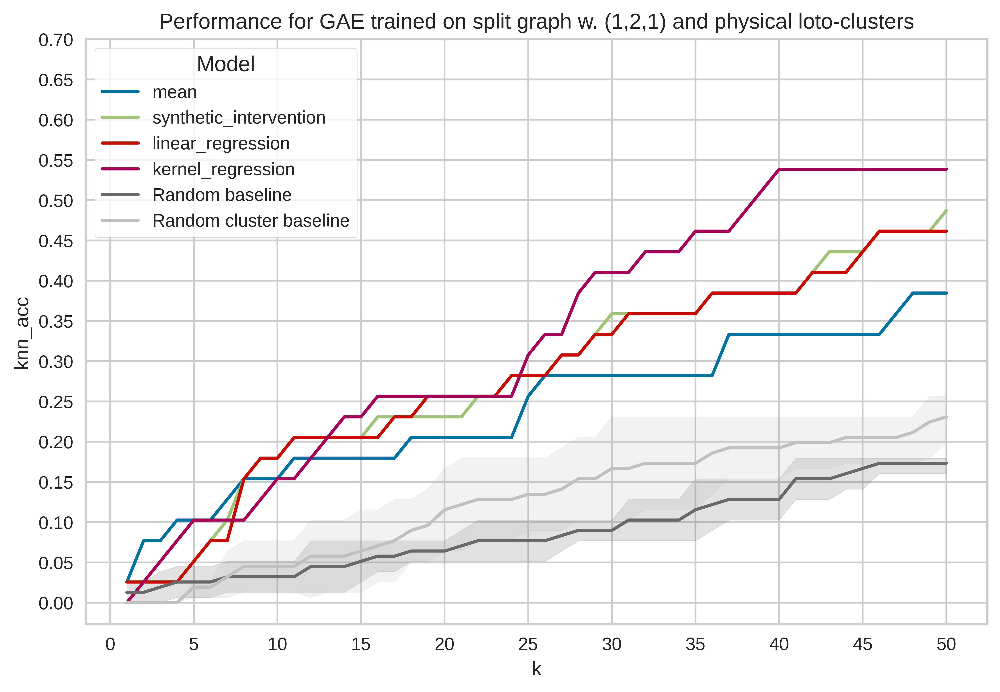

<IPython.core.display.Javascript object>

In [559]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,2,1) and physical loto-clusters",
)
plt.show()

---

#### 2.1.h. Experiment 8

In this experiment the GAE was trained on the split graphusing $(\alpha, \beta,\gamma) = (1,5,1)$ and physical loto-clusters.

In [560]:
gae_exp = "gae_exp_a1_b5_g1_split_graph_physical"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [561]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=5,
        gamma=1,
        graph="split",
        cluster="physical",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'NCOR2' 'LDOC1' 'RARA' 'KRT18']
[[ 0.05114884 -0.02405983  0.00217708 ...  0.00423853 -0.02098527
  -0.00399133]]
mean ATF4 ['RARA' 'TSC2' 'FOXO1' 'AKT1S1' 'GSK3B']
[[ 0.00094425 -0.03759182  0.00644177 ... -0.00940749 -0.01057083
  -0.00606902]]
mean BAX ['YES1' 'HSPA1B' 'TSC2' 'RHOA' 'AKT1S1']
[[-0.00692961 -0.02655256  0.01808651 ...  0.00721077 -0.00840578
   0.0005284 ]]
mean BCL2L11 ['MAP3K5' 'SRC' 'HSPA1B' 'AXL' 'PIK3R2']
[[ 0.05375809 -0.03148539  0.01271831 ...  0.02411367 -0.02464958
  -0.01211406]]
mean BRAF ['FOXO1' 'SREBF1' 'SRC' 'AKT1S1' 'MAP3K5']
[[ 0.02252864 -0.00794699  0.00069785 ...  0.02261034 -0.03047626
   0.00386062]]
mean CASP8 ['RARA' 'TSC2' 'GSK3B' 'PRAME' 'MAPK8']
[[-0.01434896  0.00476306  0.02451438 ...  0.00211374 -0.02694299
  -0.01151936]]
mean CDC42 ['HSPA1B' 'MAP3K5' 'SRC' 'RHOA' 'TSC2']
[[-0.0241811  -0.02572276  0.00185626 ...  0.02946318 -0.01293657
   0.01164462]]
mean CDKN1A ['HSPA1B' 'KPNA2' 'RARA' 'TSC2' 'MAP3K5']
[[ 0.01951

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['CD40' 'PRAME' 'DIABLO' 'SMO' 'PTCH1']
[[ 0.01227742 -0.0397592  -0.01739271 ...  0.06101667  0.02145886
   0.02520298]]
synthetic_intervention ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'GSK3B']
[[-0.02404048 -0.03725954  0.00279243 ... -0.00040601 -0.01344492
  -0.01254904]]
synthetic_intervention BAX ['FHL2' 'TSC2' 'GSK3B' 'FOXO1' 'CREB1']
[[-0.03366333 -0.0056937   0.01343576 ...  0.01382049  0.01338426
   0.02152443]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'PRAME']
[[ 0.0218942   0.02232312  0.04281076 ...  0.01824215 -0.02372443
  -0.00558593]]
synthetic_intervention BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.04018445 -0.03054251 -0.00736672 ... -0.0055672   0.00208642
  -0.00926335]]
synthetic_intervention CASP8 ['HRAS' 'BRAF' 'MAGEA11' 'SRC' 'PAK2']
[[ 0.0004217  -0.01015706  0.02860396 ... -0.01988924  0.01756113
  -0.01752165]]
synthetic_intervention CDC42 ['PRKCE' 'RAF1' 'KRT18' 'MAP3K2' 'MAPK8']
[[ 0.02754812 -0.01943

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['CD40' 'PRAME' 'DIABLO' 'SMO' 'PTCH1']
[[ 0.01229914 -0.03984603 -0.01748902 ...  0.06118019  0.02160146
   0.02527739]]
linear_regression ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'GSK3B']
[[-0.02400705 -0.03801036  0.00280961 ... -0.00054709 -0.01336075
  -0.01277034]]
linear_regression BAX ['FHL2' 'TSC2' 'GSK3B' 'FOXO1' 'CREB1']
[[-0.03329864 -0.00519467  0.01310967 ...  0.01450539  0.01373008
   0.02184884]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'PRAME']
[[ 0.01984102  0.02086523  0.04113329 ...  0.01818291 -0.02320167
  -0.00593703]]
linear_regression BRAF ['PRKCE' 'CDC42' 'PDGFRB' 'SRC' 'RAF1']
[[ 0.04019874 -0.03036565 -0.00775673 ... -0.00558275  0.0022154
  -0.00932098]]
linear_regression CASP8 ['SRC' 'HRAS' 'BRAF' 'PAK2' 'MAGEA11']
[[-0.00089357 -0.01213122  0.02882707 ... -0.01712178  0.01776118
  -0.01487238]]
linear_regression CDC42 ['PRKCE' 'RAF1' 'KRT18' 'MAP3K2' 'MAPK8']
[[ 0.02736327 -0.01883489 -0.01873303 ...  0.00137293  0.0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['PRAME' 'TLR4' 'FOXO1' 'SMO' 'PTCH1']
[[ 0.01648456 -0.03703376 -0.02599994 ...  0.04849954  0.0065045
   0.01155409]]
kernel_regression ATF4 ['MBP' 'SRC' 'IRAK4' 'PDGFRB' 'KRT18']
[[ 0.00405273 -0.04894228  0.0234565  ...  0.01245008 -0.00293279
  -0.00995531]]
kernel_regression BAX ['SMAD4' 'IRAK4' 'CREB1' 'TENM3' 'TSC2']
[[-0.04015787 -0.04995067 -0.00840928 ...  0.03464083 -0.03372968
   0.01699907]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'AXL' 'SRC' 'RHOA']
[[ 0.04063058 -0.02672646 -0.01255166 ...  0.00888188 -0.00674862
  -0.01005571]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'SRC' 'BRAF' 'PDGFRB']
[[ 0.03944263 -0.02657891 -0.00578661 ...  0.00030114 -0.00552782
  -0.00312455]]
kernel_regression CASP8 ['BRAF' 'RAF1' 'PAK2' 'KRT18' 'MAGEA11']
[[ 0.01911112 -0.01858562  0.00258376 ...  0.00059471  0.03127501
  -0.0233402 ]]
kernel_regression CDC42 ['PRKCE' 'DSP' 'MAP3K5' 'MAP3K2' 'RAF1']
[[-0.00811804 -0.03568136 -0.02098158 ...  0.00030399 -0.0015940

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

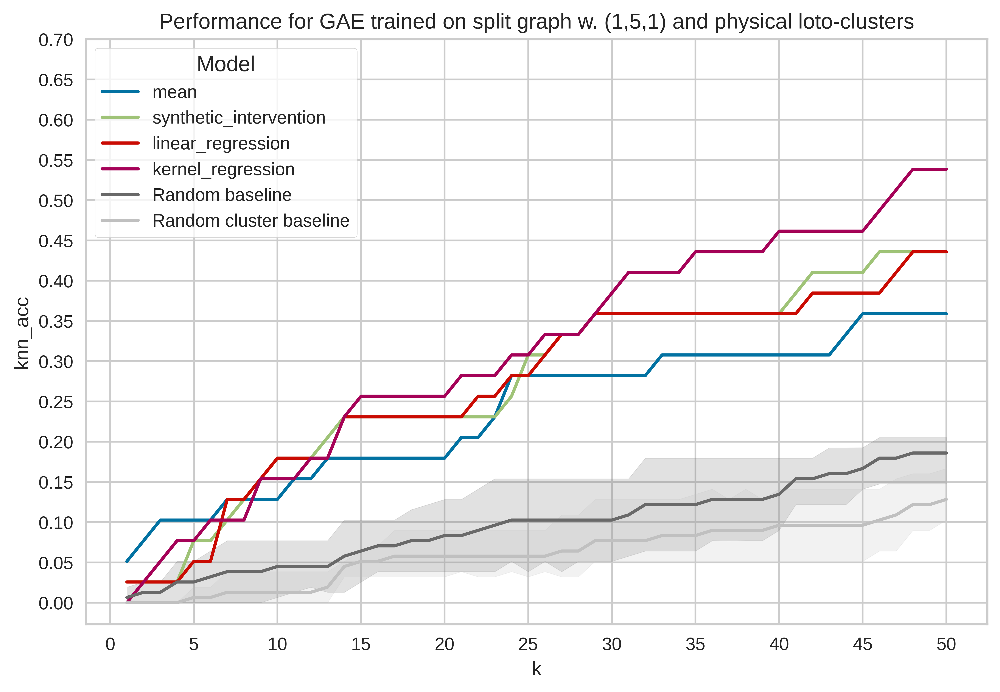

<IPython.core.display.Javascript object>

In [562]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,5,1) and physical loto-clusters",
)
plt.show()

---

#### 2.1.i. Experiment 9

In this experiment the GAE was trained on the split graph using $(\alpha, \beta,\gamma) = (1,0,1)$ using the full physical space cluster structure.

In [563]:
gae_exp = "gae_exp_a1_b0_g1_split_graph_physical_full"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [564]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=1,
        graph="split",
        cluster="physical_full",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['THRA' 'TSC2' 'RARA' 'NCOR2' 'GSK3B']
[[ 0.03934414 -0.01663245 -0.02324551 ...  0.00907796 -0.0385749
  -0.03302887]]
mean ATF4 ['FOXO1' 'RARA' 'AKT1S1' 'TSC2' 'SREBF1']
[[ 0.01690097 -0.04479904 -0.0015242  ...  0.00474534 -0.03153778
  -0.03392557]]
mean BAX ['HSPA1B' 'RHOA' 'YES1' 'TSC2' 'BCR']
[[-0.01480308 -0.01412735  0.0125427  ...  0.01198479 -0.02363618
  -0.0172365 ]]
mean BCL2L11 ['MAP3K5' 'HSPA1B' 'AXL' 'PIK3R2' 'RHOA']
[[ 0.03851935 -0.01757526  0.01966982 ...  0.040383   -0.05396843
  -0.03008002]]
mean BRAF ['FOXO1' 'TSC2' 'AKT1S1' 'MAP3K5' 'MBP']
[[ 0.00927173  0.00421989  0.01057534 ...  0.04279701 -0.05405014
  -0.01321134]]
mean CASP8 ['RARA' 'GSK3B' 'PRAME' 'AXL' 'TSC2']
[[-0.00176941  0.00330365  0.00560865 ...  0.03310026 -0.01467412
  -0.00934435]]
mean CDC42 ['FOXO1' 'TSC2' 'FHL2' 'RARA' 'MAPK8']
[[ 0.00864051  0.01566807  0.02540676 ...  0.03647182 -0.03731135
   0.01238677]]
mean CDKN1A ['KPNA2' 'TSC2' 'RELB' 'HSPA1B' 'BCR']
[[-0.01721291 -0.0109

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'SMO' 'PTCH1']
[[ 0.0171122  -0.02393167 -0.02371956 ...  0.07010608  0.00767905
  -0.00169043]]
synthetic_intervention ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'RELB']
[[-0.00880502 -0.05373571 -0.00724749 ...  0.02349018 -0.01767785
  -0.03345401]]
synthetic_intervention BAX ['FHL2' 'TSC2' 'GSK3B' 'CREB1' 'SMAD4']
[[-0.04375372  0.00465619 -0.00075672 ...  0.0294864   0.00155759
   0.02722574]]
synthetic_intervention BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'CDCA3']
[[ 0.00870992  0.02862942  0.04687646 ...  0.02492818 -0.01827537
   0.00113497]]
synthetic_intervention BRAF ['PRKCE' 'SRC' 'PDGFRB' 'CDC42' 'RAF1']
[[ 0.03798128 -0.0210207  -0.00128466 ...  0.00136367 -0.0190641
  -0.03742074]]
synthetic_intervention CASP8 ['HRAS' 'BRAF' 'RAF1' 'SRC' 'MAGEA11']
[[ 0.0019183  -0.01316498  0.0307571  ...  0.00628149  0.00296162
  -0.00821926]]
synthetic_intervention CDC42 ['DSP' 'ELK1' 'TRAF2' 'CDC42EP1' 'CDC42']
[[ 0.01948426  0.0128188

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PRAME' 'CD40' 'DIABLO' 'SMO' 'PTCH1']
[[ 0.01707222 -0.02396651 -0.02383863 ...  0.07020472  0.00797108
  -0.00159106]]
linear_regression ATF4 ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'RELB']
[[-0.00889494 -0.05420337 -0.00726043 ...  0.02327665 -0.01758614
  -0.03366715]]
linear_regression BAX ['FHL2' 'TSC2' 'GSK3B' 'CREB1' 'SMAD4']
[[-0.04356043  0.00518082 -0.00108959 ...  0.03013559  0.00211805
   0.02767039]]
linear_regression BCL2L11 ['DIABLO' 'CD40' 'TRAF2' 'EFEMP1' 'CDCA3']
[[ 0.00793059  0.02714585  0.04587454 ...  0.02476205 -0.01744549
   0.0001133 ]]
linear_regression BRAF ['PRKCE' 'SRC' 'PDGFRB' 'CDC42' 'RAF1']
[[ 0.03794672 -0.02099114 -0.00161345 ...  0.00137981 -0.01886536
  -0.03747187]]
linear_regression CASP8 ['HRAS' 'BRAF' 'SRC' 'RAF1' 'PDGFRB']
[[ 0.0014294  -0.01539061  0.03036903 ...  0.00955306  0.00256882
  -0.0064055 ]]
linear_regression CDC42 ['DSP' 'ELK1' 'TRAF2' 'CDC42EP1' 'CDC42']
[[ 0.01922603  0.01306335 -0.01142702 ...  0.04038342  0.01

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['TLR4' 'SMO' 'AKT1S1' 'PTCH1' 'FOXO1']
[[ 0.01750494 -0.0224362  -0.03712347 ...  0.0533675  -0.00845041
  -0.0199395 ]]
kernel_regression ATF4 ['MBP' 'IRAK4' 'GIT1' 'PLCG1' 'SRC']
[[ 0.0200092  -0.0520607   0.016115   ...  0.02943036 -0.01469711
  -0.02464237]]
kernel_regression BAX ['IRAK4' 'CREB1' 'SMAD4' 'GLI2' 'TSC2']
[[-0.02998862 -0.04114383 -0.01365967 ...  0.04733994 -0.03781977
   0.00511483]]
kernel_regression BCL2L11 ['PRKCE' 'PIK3R2' 'AXL' 'SRC' 'RHOA']
[[ 0.03498891 -0.01788482  0.00058506 ...  0.01864785 -0.02954103
  -0.0347629 ]]
kernel_regression BRAF ['RAF1' 'PRKCE' 'SRC' 'BRAF' 'PAK2']
[[ 0.03443125 -0.01432136  0.00273385 ...  0.00926379 -0.02827064
  -0.03156749]]
kernel_regression CASP8 ['BRAF' 'RAF1' 'KRT18' 'PAK2' 'MAGEA11']
[[ 0.01554165 -0.01806985 -0.00729251 ...  0.02400458  0.032249
  -0.02343628]]
kernel_regression CDC42 ['PRKCE' 'PDGFRB' 'DSP' 'HK2' 'FGFR3']
[[-0.01002677  0.00858333 -0.01334108 ...  0.0372508   0.02394421
   0.

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

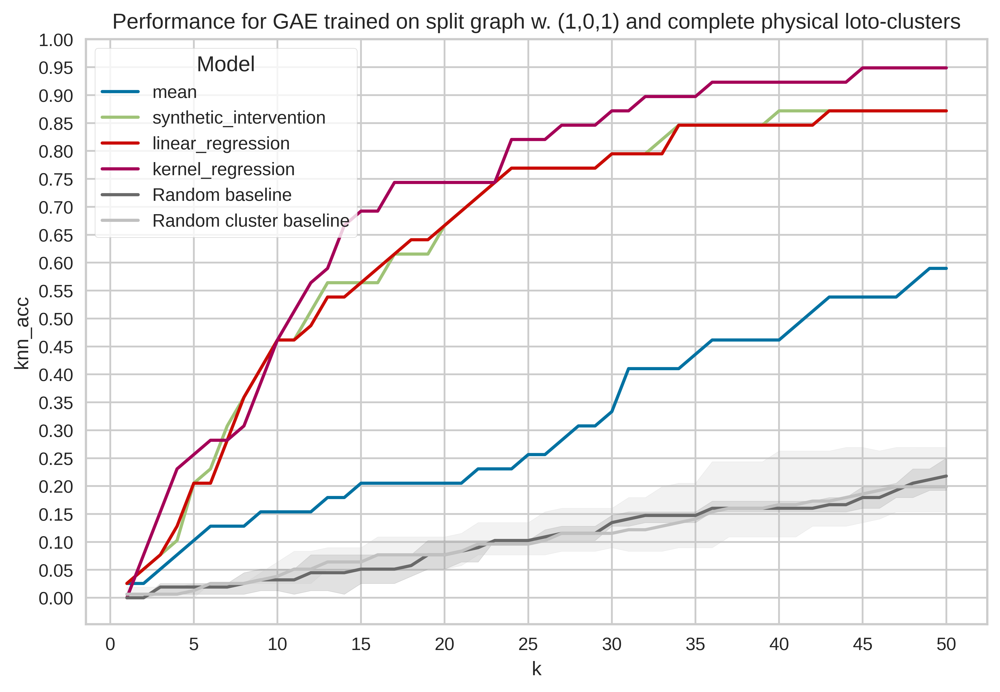

<IPython.core.display.Javascript object>

In [565]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=1.05,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,1) and complete physical loto-clusters",
)
plt.show()

---

#### 2.1.j. Experiment 10

In this experiment the GAE was trained on the split graph using $(\alpha, \beta,\gamma) = (1,0,1)$ and CMAP loto-clusters.

In [566]:
gae_exp = "gae_exp_a1_b0_g1_split_graph_cmap"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [567]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=1,
        graph="split",
        cluster="cmap",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['RARA' 'CEBPA' 'AXL' 'PDGFRB' 'SRC']
[[-0.01887811 -0.01146544 -0.01520816 ...  0.03604951  0.00330338
  -0.00581726]]
mean ATF4 ['YES1' 'SMAD4' 'HSPA1B' 'BCR' 'RHOA']
[[-0.01272556 -0.01838933 -0.01897819 ...  0.05446151 -0.01202324
  -0.00522743]]
mean BAX ['YES1' 'BCR' 'HSPA1B' 'PIK3R2' 'SRC']
[[-0.01250948 -0.01637668 -0.00775836 ...  0.0401315  -0.01517872
  -0.01553719]]
mean BCL2L11 ['HSPA1B' 'PIK3R2' 'YES1' 'CDK14' 'BCR']
[[-0.00966096 -0.02587389 -0.02353827 ...  0.04285232 -0.0084979
  -0.00956906]]
mean BRAF ['HSPA1B' 'YES1' 'PIK3R2' 'AXL' 'RHOA']
[[-0.00830957 -0.02265002 -0.01775783 ...  0.04159967 -0.00029536
  -0.00554886]]
mean CASP8 ['HSPA1B' 'YES1' 'BCR' 'RHOA' 'SRC']
[[-0.01107452 -0.02210407 -0.02113663 ...  0.04250683 -0.00348955
  -0.00109331]]
mean CDC42 ['YES1' 'CDC42' 'HSPA1B' 'SMAD4' 'AXL']
[[-0.01375797 -0.01630826 -0.02316449 ...  0.04151051 -0.00819475
  -0.00538814]]
mean CDKN1A ['YES1' 'BCR' 'HSPA1B' 'RHOA' 'SRC']
[[-0.01709206 -0.01887225 -0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PTCH1' 'SMO' 'SREBF1' 'GLI1' 'NEK2']
[[ 0.02908431 -0.00168111  0.00136348 ...  0.0379558  -0.02196702
   0.02626509]]
synthetic_intervention ATF4 ['SMAD4' 'FHL2' 'PIK3R2' 'FOXO1' 'RHOA']
[[-0.00973221 -0.01642236 -0.02006299 ...  0.05529935 -0.03534108
  -0.01163611]]
synthetic_intervention BAX ['FHL2' 'CREB1' 'FOXO1' 'SMAD4' 'PRKACA']
[[ 0.00046152 -0.01697176  0.00226612 ...  0.043046    0.02731134
   0.02490394]]
synthetic_intervention BCL2L11 ['RHOA' 'PIK3R2' 'YES1' 'HSPA1B' 'AXL']
[[-0.00755144 -0.01574805 -0.00395197 ...  0.04402258 -0.02287864
  -0.01969767]]
synthetic_intervention BRAF ['HRAS' 'PAK2' 'RAF1' 'BRAF' 'CDC42']
[[ 0.00359566 -0.03813162 -0.00109206 ... -0.007298    0.00292052
  -0.01791545]]
synthetic_intervention CASP8 ['SRC' 'BCR' 'RHOA' 'AXL' 'HSPA1B']
[[-0.01421979 -0.02423311 -0.02214515 ...  0.03546166 -0.00700224
  -0.01175594]]
synthetic_intervention CDC42 ['RAF1' 'BRAF' 'HRAS' 'PAK2' 'KRT18']
[[ 2.32423659e-02 -5.84376088e-0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PTCH1' 'SMO' 'SREBF1' 'GLI1' 'NEK2']
[[ 0.02919636 -0.0013001   0.00126887 ...  0.03858731 -0.02136191
   0.02688347]]
linear_regression ATF4 ['SMAD4' 'FHL2' 'PIK3R2' 'FOXO1' 'RHOA']
[[-0.00983563 -0.01684481 -0.02003477 ...  0.05516921 -0.03606712
  -0.01160006]]
linear_regression BAX ['FHL2' 'CREB1' 'FOXO1' 'SMAD4' 'LDOC1']
[[ 0.00021568 -0.01644352  0.0020598  ...  0.0433591   0.02824052
   0.0250712 ]]
linear_regression BCL2L11 ['RHOA' 'YES1' 'PIK3R2' 'CASP8' 'BCR']
[[-0.00701248 -0.01668615 -0.00225551 ...  0.04395665 -0.02433372
  -0.02047439]]
linear_regression BRAF ['HRAS' 'PAK2' 'RAF1' 'BRAF' 'CDC42']
[[ 0.00365122 -0.03778769 -0.0014686  ... -0.00750528  0.00408392
  -0.01768798]]
linear_regression CASP8 ['BCR' 'SRC' 'RHOA' 'AXL' 'HSPA1B']
[[-0.01514131 -0.02582301 -0.02185359 ...  0.03649823 -0.01013803
  -0.01237028]]
linear_regression CDC42 ['RAF1' 'BRAF' 'HRAS' 'PAK2' 'KRT18']
[[ 0.02327316 -0.00040892 -0.01096894 ... -0.01256609  0.00744483
  -

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['RHOA' 'SRC' 'PIK3R2' 'BCR' 'PDGFRB']
[[-0.0017659  -0.02401983 -0.02022522 ...  0.04499708 -0.00240438
  -0.00745297]]
kernel_regression ATF4 ['CASP8' 'PIK3R2' 'CD40' 'IRF7' 'YES1']
[[-0.00709747 -0.02936507 -0.00223494 ...  0.04525552 -0.04640489
  -0.01623304]]
kernel_regression BAX ['MYD88' 'CD40' 'TRAF2' 'IRF7' 'CASP8']
[[-0.04511949 -0.00506077  0.00648538 ...  0.02609386 -0.06406143
  -0.02877152]]
kernel_regression BCL2L11 ['PAK2' 'RAF1' 'BRAF' 'CDC42' 'HSP90AB1']
[[ 0.00590441 -0.0323018  -0.00174299 ...  0.01050709  0.00539581
  -0.02585258]]
kernel_regression BRAF ['RAF1' 'BRAF' 'PAK2' 'KRT18' 'HRAS']
[[ 0.00467346 -0.0236306   0.00308604 ... -0.01221061  0.00503043
  -0.03385597]]
kernel_regression CASP8 ['MAPK8' 'CDC42' 'LDOC1' 'PAK2' 'KRT8']
[[-0.00231729 -0.01188339  0.00013172 ...  0.02334294  0.01453399
   0.00239646]]
kernel_regression CDC42 ['KRT18' 'PRKCE' 'RAF1' 'BRAF' 'PAK2']
[[-0.00292332 -0.00651575  0.01270632 ... -0.01018703 -0.009900

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

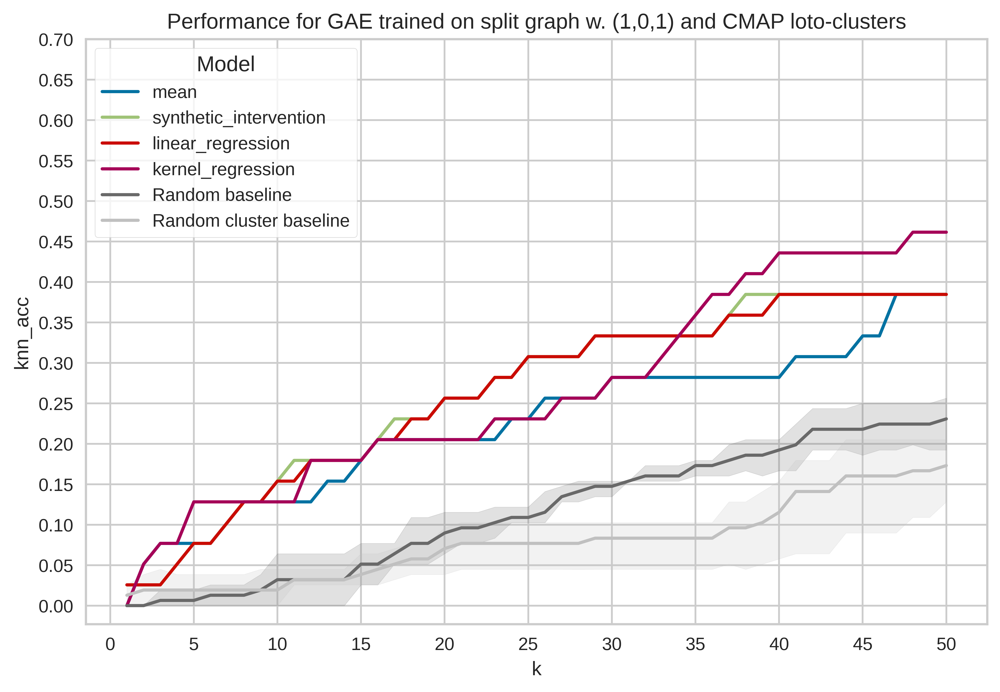

<IPython.core.display.Javascript object>

In [568]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,1) and CMAP loto-clusters",
)
plt.show()

---

#### 2.1.k. Experiment 11

In this experiment the GAE was trained on the split graph using $(\alpha, \beta,\gamma) = (1,0,1)$ and the full CMAP clustering structure.

In [569]:
gae_exp = "gae_exp_a1_b0_g1_split_graph_cmap_full"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [570]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=1,
        graph="split",
        cluster="cmap_full",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['YES1' 'HSPA1B' 'BCR' 'SMAD4' 'RHOA']
[[-0.01525871 -0.02212952 -0.0226847  ...  0.04354798 -0.00100567
  -0.00270494]]
mean ATF4 ['HSPA1B' 'YES1' 'BCR' 'CDK14' 'SRC']
[[-0.02250612 -0.01647008 -0.0178052  ...  0.02961048 -0.00390918
  -0.01458876]]
mean BAX ['YES1' 'HSPA1B' 'BCR' 'RHOA' 'PIK3R2']
[[-0.01073256 -0.01965681 -0.02146443 ...  0.04066673 -0.0127738
  -0.01085488]]
mean BCL2L11 ['YES1' 'RHOA' 'BCR' 'SMAD4' 'HSPA1B']
[[-0.01948921 -0.02138815 -0.02728207 ...  0.04395815 -0.01175379
  -0.00737606]]
mean BRAF ['YES1' 'HSPA1B' 'SMAD4' 'RHOA' 'BCR']
[[-0.01166694 -0.02343718 -0.02008765 ...  0.04659891 -0.01109558
  -0.00376541]]
mean CASP8 ['YES1' 'HSPA1B' 'RHOA' 'SMAD4' 'BCR']
[[-0.01681326 -0.02412068 -0.02462435 ...  0.04855835 -0.00756302
  -0.00553376]]
mean CDC42 ['YES1' 'HSPA1B' 'PIK3R2' 'RHOA' 'SMAD4']
[[-0.00701752 -0.02105331 -0.01652982 ...  0.04722689 -0.01035863
  -0.00849625]]
mean CDKN1A ['YES1' 'HSPA1B' 'BCR' 'SRC' 'RHOA']
[[-0.01461323 -0.02058254 

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PTCH1' 'SMO' 'AKT1S1' 'SREBF1' 'MYD88']
[[ 0.00865468 -0.01298793 -0.00466864 ...  0.0312121  -0.0391834
   0.00578018]]
synthetic_intervention ATF4 ['SMAD4' 'PIK3R2' 'FOXO1' 'RHOA' 'AXL']
[[-0.01669003 -0.0140188  -0.01247737 ...  0.04133238 -0.0268258
  -0.01929675]]
synthetic_intervention BAX ['FHL2' 'CLU' 'SMAD4' 'MDC1' 'CREB1']
[[ 0.00120914 -0.02069766 -0.00753771 ...  0.04865374  0.02600492
   0.03031753]]
synthetic_intervention BCL2L11 ['RHOA' 'CASP8' 'HSPA1B' 'PIK3R2' 'DIABLO']
[[-0.01418771 -0.01568513 -0.01546564 ...  0.04226513 -0.03615307
  -0.01875352]]
synthetic_intervention BRAF ['HRAS' 'PAK2' 'BRAF' 'RAF1' 'CDC42']
[[-0.00334535 -0.03496362 -0.00238512 ... -0.0083031   0.00021871
  -0.0196293 ]]
synthetic_intervention CASP8 ['SRC' 'BCR' 'RHOA' 'AXL' 'YES1']
[[-0.01902006 -0.02715891 -0.02337143 ...  0.03654293 -0.01175932
  -0.01756154]]
synthetic_intervention CDC42 ['RAF1' 'BRAF' 'PAK2' 'HRAS' 'CDC42']
[[ 0.02688846 -0.00996531 -0.00136

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PTCH1' 'SMO' 'AKT1S1' 'SREBF1' 'MYD88']
[[ 0.00854638 -0.0126687  -0.00534117 ...  0.0320287  -0.03826856
   0.00676985]]
linear_regression ATF4 ['PIK3R2' 'SMAD4' 'FOXO1' 'RHOA' 'AXL']
[[-0.01677817 -0.01442103 -0.01234229 ...  0.04123582 -0.02752863
  -0.01934004]]
linear_regression BAX ['FHL2' 'CLU' 'SMAD4' 'MDC1' 'CREB1']
[[ 0.00086854 -0.02011544 -0.00767643 ...  0.04897708  0.02688262
   0.03055138]]
linear_regression BCL2L11 ['RHOA' 'CASP8' 'DIABLO' 'PIK3R2' 'HSPA1B']
[[-0.01383974 -0.01667325 -0.01424423 ...  0.04213395 -0.03855729
  -0.01945624]]
linear_regression BRAF ['HRAS' 'PAK2' 'BRAF' 'RAF1' 'CDC42']
[[-0.00325103 -0.03469403 -0.00269242 ... -0.00847611  0.00139995
  -0.01944396]]
linear_regression CASP8 ['BCR' 'SRC' 'RHOA' 'AXL' 'YES1']
[[-0.02002922 -0.02879876 -0.02338217 ...  0.03759407 -0.01548494
  -0.01832379]]
linear_regression CDC42 ['RAF1' 'BRAF' 'PAK2' 'HRAS' 'CDC42']
[[ 0.0269247  -0.0101009  -0.00175868 ... -0.01086285  0.00696532
 

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['PDGFRB' 'AXL' 'PIK3R2' 'RHOA' 'PLCG1']
[[ 0.01462742 -0.044791   -0.01546025 ...  0.04893415 -0.01485094
  -0.00688534]]
kernel_regression ATF4 ['PIK3R2' 'CD40' 'YES1' 'CASP8' 'TRAF2']
[[-0.02061297 -0.0276825   0.00157335 ...  0.02250923 -0.03196406
  -0.02747543]]
kernel_regression BAX ['MYD88' 'IRF7' 'CASP8' 'TLR4' 'TRAF2']
[[-0.04470052 -0.01422928 -0.01282199 ...  0.03048493 -0.06184658
  -0.02126379]]
kernel_regression BCL2L11 ['RAF1' 'PAK2' 'BRAF' 'CDC42' 'KRT18']
[[-0.00184939 -0.0298212  -0.00691457 ...  0.00860264  0.00257066
  -0.0225825 ]]
kernel_regression BRAF ['RAF1' 'BRAF' 'PAK2' 'KRT18' 'HRAS']
[[-0.00057629 -0.02098823  0.00263494 ... -0.01214658  0.00044956
  -0.0335472 ]]
kernel_regression CASP8 ['MAPK8' 'CDC42' 'PAK2' 'KRT8' 'ELK1']
[[-0.00532254 -0.0113785  -0.00025016 ...  0.02659931  0.02011719
   0.00036334]]
kernel_regression CDC42 ['KRT18' 'PRKCE' 'RAF1' 'BRAF' 'HK2']
[[ 0.00440818 -0.01151676  0.01778543 ... -0.00831104 -0.00922249

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

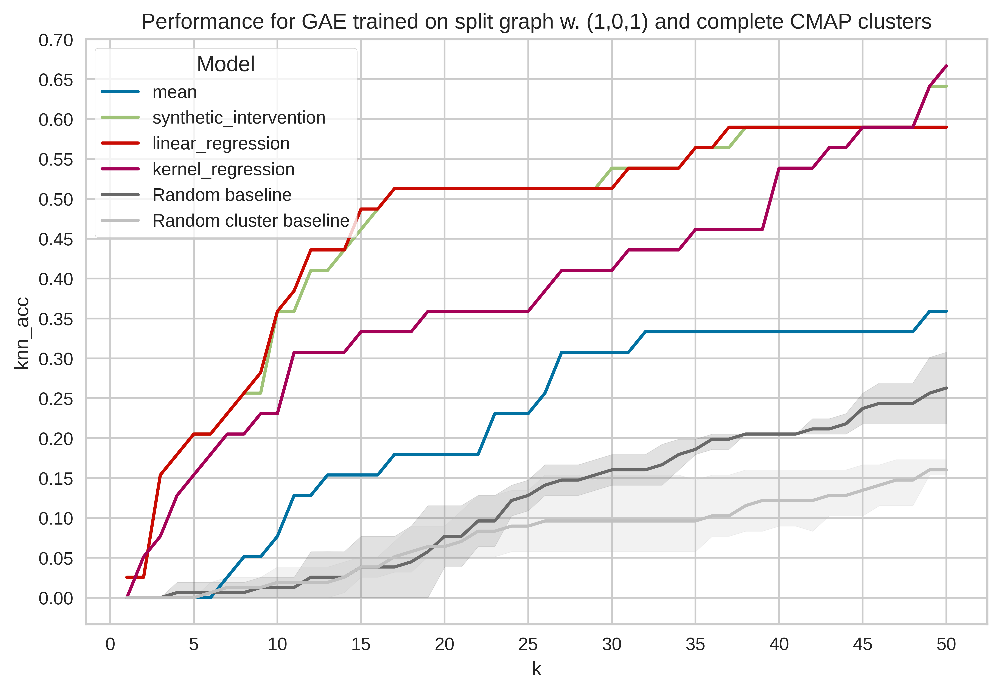

<IPython.core.display.Javascript object>

In [571]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,1) and complete CMAP clusters",
)
plt.show()

---

##### Experiment  2.12.l. 


In [659]:
gae_exp = "gae_exp_a0_b0_g1_split_graph_cmap_full"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [660]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=0,
        beta=0,
        gamma=1,
        graph="split",
        cluster="cmap_full",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['MAGED1' 'VIM' 'MAGEA4' 'MAGEA6' 'S100A14']
[[-0.05777367 -0.04671191 -0.01866896 ... -0.00220275 -0.00989509
  -0.01824003]]
mean ATF4 ['MAGED1' 'VIM' 'MAGEA4' 'MAGEA6' 'S100A14']
[[-0.05641156 -0.04595218 -0.01918577 ... -0.00155611 -0.01150849
  -0.02009655]]
mean BAX ['MAGED1' 'VIM' 'MAGEA4' 'MAGEA6' 'S100A14']
[[-0.060495   -0.04958692 -0.0207846  ... -0.00390719 -0.01154375
  -0.01738068]]
mean BCL2L11 ['MAGED1' 'VIM' 'MAGEA4' 'S100A14' 'MAGEA6']
[[-0.05813405 -0.04782546 -0.02076301 ... -0.00382289 -0.00974795
  -0.01847977]]
mean BRAF ['MAGEA4' 'MAGED1' 'VIM' 'MAGEA6' 'CDK14']
[[-0.05779324 -0.05119121 -0.02076696 ... -0.0021589  -0.01169622
  -0.01646606]]
mean CASP8 ['VIM' 'MAGED1' 'MAGEA6' 'MAGEA4' 'S100A14']
[[-0.05847562 -0.04772822 -0.02219547 ...  0.000838   -0.00919088
  -0.01655445]]
mean CDC42 ['MAGED1' 'MAGEA4' 'VIM' 'MAGEA6' 'CDK14']
[[-0.05623184 -0.04569044 -0.0195808  ...  0.00036491 -0.01085753
  -0.01634632]]
mean CDKN1A ['MAGEA4' 'MAGED1' 'MAGEA6'

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PTCH1' 'AKT1S1' 'SMO' 'FKBP4' 'S100A2']
[[-0.01563209 -0.04478334 -0.00015242 ...  0.01017548 -0.03014358
  -0.00795397]]
synthetic_intervention ATF4 ['NCAM1' 'MDC1' 'TUBB' 'TUBB2B' 'HSPA1B']
[[-0.04497037 -0.04590378 -0.03063808 ...  0.01680871 -0.01003923
  -0.01839062]]
synthetic_intervention BAX ['CDK6' 'RUNX1' 'MYC' 'MSH2' 'CCND2']
[[-0.0576053  -0.02973792 -0.01209364 ... -0.0067603   0.00604595
  -0.00351774]]
synthetic_intervention BCL2L11 ['RHOA' 'PCLO' 'LZTS2' 'CASP8' 'PLCG1']
[[-0.03447352 -0.05260239 -0.02437011 ...  0.01825794 -0.02647791
  -0.03124568]]
synthetic_intervention BRAF ['PAK2' 'CDC42' 'KRT81' 'HSP90AB1' 'HRAS']
[[-0.0615209  -0.05160291  0.00103952 ... -0.02317024 -0.03436813
  -0.03815524]]
synthetic_intervention CASP8 ['MDK' 'ALOX5' 'MFAP2' 'SPARC' 'TIMP1']
[[-0.02996591 -0.05187438 -0.03111823 ...  0.0287113  -0.01893584
  -0.00577543]]
synthetic_intervention CDC42 ['MYL2' 'CDC42' 'PAK2' 'KRT15' 'MAP3K9']
[[-0.06679471 -0.041

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PTCH1' 'AKT1S1' 'SMO' 'FKBP4' 'S100A2']
[[-0.01584749 -0.0449205  -0.00075174 ...  0.01037454 -0.02958421
  -0.00745962]]
linear_regression ATF4 ['MDC1' 'NCAM1' 'HSPA1B' 'TUBB2B' 'TUBB']
[[-0.04487396 -0.04580712 -0.03040556 ...  0.01682097 -0.01031896
  -0.01844896]]
linear_regression BAX ['CDK6' 'RUNX1' 'MYC' 'MSH2' 'CCND2']
[[-0.05777745 -0.02969627 -0.01227242 ... -0.00700712  0.00643923
  -0.00357965]]
linear_regression BCL2L11 ['RHOA' 'LZTS2' 'PCLO' 'CASP8' 'EFEMP1']
[[-0.03324914 -0.0524429  -0.02254569 ...  0.01828018 -0.0284448
  -0.03170052]]
linear_regression BRAF ['PAK2' 'CDC42' 'KRT81' 'HSP90AB1' 'HRAS']
[[-0.06194712 -0.05165207  0.00050747 ... -0.02333814 -0.03359543
  -0.03782796]]
linear_regression CASP8 ['ALOX5' 'MDK' 'TIMP1' 'MFAP2' 'SPARC']
[[-0.02911657 -0.0513179  -0.03075383 ...  0.02983671 -0.02047255
  -0.00705007]]
linear_regression CDC42 ['MYL2' 'CDC42' 'PAK2' 'MAP3K9' 'KRT15']
[[-0.06699417 -0.04129103 -0.00962413 ... -0.02720363 -

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['AKT1S1' 'S100A2' 'FKBP4' 'NOTCH3' 'MAGEA4']
[[-0.02948001 -0.05083972 -0.00838825 ...  0.00865152 -0.02118393
  -0.01653317]]
kernel_regression ATF4 ['KPNA2' 'SFN' 'MAGEA1' 'TRAF2' 'HSP90AB1']
[[-0.05948103 -0.03481856 -0.00263078 ... -0.01092728 -0.02762011
  -0.03671493]]
kernel_regression BAX ['TRAF2' 'CD40' 'TPX2' 'CDCA3' 'CCNB1']
[[-0.05458304 -0.03116399 -0.00721556 ... -0.0011743  -0.02757647
  -0.02734581]]
kernel_regression BCL2L11 ['KRT80' 'PAK2' 'HSP90AB1' 'RAF1' 'MAGEA1']
[[-0.06570678 -0.04290224 -0.00582762 ... -0.02003653 -0.02225187
  -0.03607685]]
kernel_regression BRAF ['RAF1' 'KRT80' 'KRT15' 'KRT18' 'BRAF']
[[-0.06974409 -0.03961285  0.00092911 ... -0.03023832 -0.02586096
  -0.04318632]]
kernel_regression CASP8 ['LDOC1' 'KRT8' 'TNNT1' 'CNN1' 'KLK6']
[[-0.05889175 -0.04574798 -0.01506864 ... -0.00442815 -0.01262809
  -0.0124164 ]]
kernel_regression CDC42 ['UCHL5' 'RAF1' 'BRAF' 'KRT18' 'KRT80']
[[-0.06657554 -0.02251782  0.01068217 ... -0.032

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

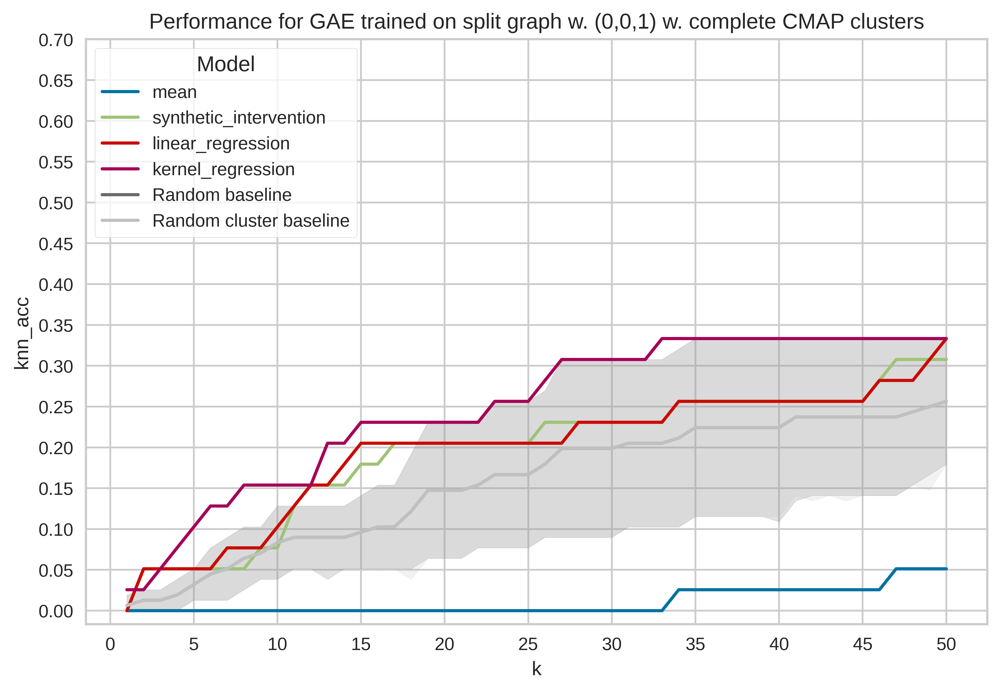

<IPython.core.display.Javascript object>

In [661]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (0,0,1) w. complete CMAP clusters",
)
plt.show()

---

##### Experiment  2.13.m. 


In [830]:
gae_exp = "gae_exp_a1_b0_g1_split_graph_cmap_full_all_nodes"
pert_reg_embs_dict = exp_embs_dict[gae_exp]

<IPython.core.display.Javascript object>

In [831]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_results = []
for model_type in model_types:
    (
        knn_acc_results,
        perm_knn_acc_results,
        perm_cluster_knn_acc_results,
    ) = get_all_loto_knn_accs_for_model(
        reg_embs_dict=pert_reg_embs_dict["reg_embs"],
        pert_embs_dict=pert_reg_embs_dict["pert_embs"],
        alpha=1,
        beta=0,
        gamma=1,
        graph="split",
        cluster="cmap_full_all_nodes",
        b=b,
        n_clusters=5,
        model_type=model_type,
    )
    all_knn_acc_results.append(knn_acc_results)
    all_perm_knn_acc_results.append(perm_knn_acc_results)
    all_perm_cluster_knn_results.append(perm_cluster_knn_acc_results)

knn_acc_results = pd.concat(all_knn_acc_results)
perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_results)

knn_acc_results_dict[gae_exp] = {
    "knn_results": knn_acc_results.copy(),
    "perm_knn_results": perm_knn_acc_results.copy(),
    "perm_cluster_knn_results": perm_cluster_knn_acc_results.copy(),
}

mean AKT1S1 ['HSPA1B' 'LDOC1' 'MAPK8' 'TSC2' 'RARA']
[[-0.01186116  0.02304154 -0.01095794 ...  0.0535603  -0.00550109
   0.03904937]]
mean ATF4 ['HSPA1B' 'SRC' 'TSC2' 'KRT18' 'LDOC1']
[[-0.00957669  0.02411107  0.00017535 ...  0.05004929 -0.01353533
   0.02968573]]
mean BAX ['TSC2' 'HSPA1B' 'LDOC1' 'FOXO1' 'RAF1']
[[-0.02326974  0.03084507 -0.00096638 ...  0.04183389 -0.00494352
   0.03774013]]
mean BCL2L11 ['HSPA1B' 'TSC2' 'LDOC1' 'RAF1' 'KRT18']
[[-0.01652339  0.02909717  0.00118146 ...  0.04496283 -0.01150223
   0.03091444]]
mean BRAF ['LDOC1' 'HSPA1B' 'TSC2' 'FOXO1' 'BAX']
[[-0.00502412  0.02235809  0.00088552 ...  0.05066737 -0.00878295
   0.03040259]]
mean CASP8 ['HSPA1B' 'LDOC1' 'TSC2' 'FOXO1' 'RARA']
[[-0.00299669  0.02398079  0.00161422 ...  0.04793273 -0.01678097
   0.02366269]]
mean CDC42 ['HSPA1B' 'LDOC1' 'TSC2' 'FOXO1' 'FHL2']
[[ 0.00114776  0.0275758   0.00318662 ...  0.04466402 -0.01388689
   0.02440211]]
mean CDKN1A ['TSC2' 'HSPA1B' 'SRC' 'LDOC1' 'FOXO1']
[[-0.00694139

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

ntk AKT1S1 ['IRF7' 'FOXO1' 'SMAD4' 'FHL2' 'CREB1']
[[-0.02262269 -0.00398397  0.00480766 ...  0.03307049 -0.02720255
   0.01879075]]
ntk ATF4 ['GSK3B' 'TSC2' 'CREB1' 'FHL2' 'FOXO1']
[[ 0.00228098  0.0145011   0.03256654 ...  0.04729506 -0.04465998
   0.0019428 ]]
ntk BAX ['FOXO1' 'TSC2' 'FHL2' 'SMAD4' 'CREB1']
[[-0.0161177   0.01020632  0.0128538  ...  0.04031929 -0.03493232
   0.01739005]]
ntk BCL2L11 ['HSPA1B' 'CASP8' 'YES1' 'TRAF2' 'RAF1']
[[-0.01307396  0.03419395  0.01586245 ...  0.03907867 -0.01540156
   0.01985213]]
ntk BRAF ['RAF1' 'BRAF' 'HRAS' 'PAK2' 'KRT18']
[[-0.00880823  0.03051829 -0.00529879 ...  0.02588473  0.00804153
   0.03374526]]
ntk CASP8 ['BAX' 'CDC42' 'LDOC1' 'MAPK8' 'KRT8']
[[ 0.02068674  0.00851646 -0.000262   ...  0.05327523 -0.01130492
   0.00707478]]
ntk CDC42 ['RAF1' 'PAK2' 'LDOC1' 'HSPA1B' 'KRT18']
[[ 0.00563553  0.03522078 -0.01919927 ...  0.03892516  0.00596279
   0.04296601]]
ntk CDKN1A ['TSC2' 'SFN' 'DIABLO' 'MAP3K2' 'SMAD4']
[[-0.03634742  0.03675685 

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

synthetic_intervention AKT1S1 ['PTCH1' 'SMO' 'SREBF1' 'IRAK4' 'GLI1']
[[-0.02759477 -0.01526794  0.00684305 ... -0.0069245  -0.00497542
   0.01299546]]
synthetic_intervention ATF4 ['TSC2' 'CREB1' 'GSK3B' 'FHL2' 'SMAD4']
[[-0.0002892   0.02790608  0.03667195 ...  0.03860768 -0.05767118
  -0.01258133]]
synthetic_intervention BAX ['FOXO1' 'NCOR2' 'ATF4' 'RARA' 'FHL2']
[[ 0.00684916 -0.01023843 -0.00743667 ...  0.04127201  0.01573906
   0.04765376]]
synthetic_intervention BCL2L11 ['GSK3B' 'HSPA1B' 'TRAF2' 'CASP8' 'YES1']
[[-0.01177141  0.04925736  0.04426081 ...  0.02249908 -0.03151695
   0.00387421]]
synthetic_intervention BRAF ['BRAF' 'HRAS' 'RAF1' 'PAK2' 'CDC42']
[[-0.01322246  0.02587198 -0.00570757 ...  0.0155922   0.02912789
   0.04613155]]
synthetic_intervention CASP8 ['BCR' 'PDGFRB' 'RHOA' 'SRC' 'KRT18']
[[ 0.02615789  0.00267927  0.01468993 ...  0.03522953 -0.03121851
  -0.01569513]]
synthetic_intervention CDC42 ['RAF1' 'PAK2' 'HSP90AB1' 'KRT18' 'HSPA1B']
[[ 0.0327637   0.04336622

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

linear_regression AKT1S1 ['PTCH1' 'SMO' 'SREBF1' 'GLI1' 'IRAK4']
[[-0.02681081 -0.01498998  0.00644748 ... -0.00605418 -0.00455178
   0.01377559]]
linear_regression ATF4 ['TSC2' 'CREB1' 'GSK3B' 'FHL2' 'SMAD4']
[[-0.00068163  0.02706851  0.03675499 ...  0.03846048 -0.05817533
  -0.01316179]]
linear_regression BAX ['FOXO1' 'NCOR2' 'ATF4' 'RARA' 'FHL2']
[[ 0.00677512 -0.00936065 -0.00783386 ...  0.04160285  0.01621867
   0.04832568]]
linear_regression BCL2L11 ['CASP8' 'YES1' 'GSK3B' 'HSPA1B' 'TRAF2']
[[-0.01304651  0.04613128  0.04494621 ...  0.02104694 -0.0325553
   0.00125181]]
linear_regression BRAF ['BRAF' 'HRAS' 'RAF1' 'PAK2' 'CDC42']
[[-0.01295167  0.02688708 -0.00593501 ...  0.01587882  0.03001198
   0.0473723 ]]
linear_regression CASP8 ['BCR' 'PDGFRB' 'RHOA' 'SRC' 'AXL']
[[ 0.02407697  0.00075458  0.01662701 ...  0.03318732 -0.03515482
  -0.0191851 ]]
linear_regression CDC42 ['RAF1' 'PAK2' 'HSP90AB1' 'KRT18' 'HSPA1B']
[[ 0.03267535  0.04363173 -0.00926201 ...  0.02947028  0.011333

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

kernel_regression AKT1S1 ['IRF7' 'TLR4' 'MYD88' 'SRC' 'AXL']
[[-0.01852982 -0.00672224  0.00319093 ...  0.03714929 -0.02703575
   0.01159669]]
kernel_regression ATF4 ['AXL' 'PIK3R2' 'RHOA' 'PDGFRB' 'SRC']
[[ 0.00342003 -0.01367425  0.00498417 ...  0.04173752 -0.04796141
  -0.01606852]]
kernel_regression BAX ['IRF7' 'MYD88' 'SMAD4' 'TLR4' 'IRAK4']
[[-0.05796323 -0.00612472  0.01470912 ...  0.02012371 -0.06318838
  -0.01768625]]
kernel_regression BCL2L11 ['PRKCE' 'KRT18' 'BCR' 'RAF1' 'BRAF']
[[ 0.00561721  0.020555   -0.00623011 ...  0.02876663  0.00219162
   0.02639048]]
kernel_regression BRAF ['RAF1' 'KRT18' 'BRAF' 'PRKCE' 'PAK2']
[[-0.00516994  0.03305982 -0.00699789 ...  0.02317535  0.00780994
   0.03134216]]
kernel_regression CASP8 ['CDC42' 'LDOC1' 'BCR' 'RAF1' 'KRT18']
[[ 0.02476243  0.01004618 -0.01109242 ...  0.05470909  0.01926916
   0.02736564]]
kernel_regression CDC42 ['PRKCE' 'KRT18' 'RAF1' 'PAK2' 'BRAF']
[[ 0.00787077  0.02649282 -0.00911007 ...  0.02460647  0.0037433
   0.0

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

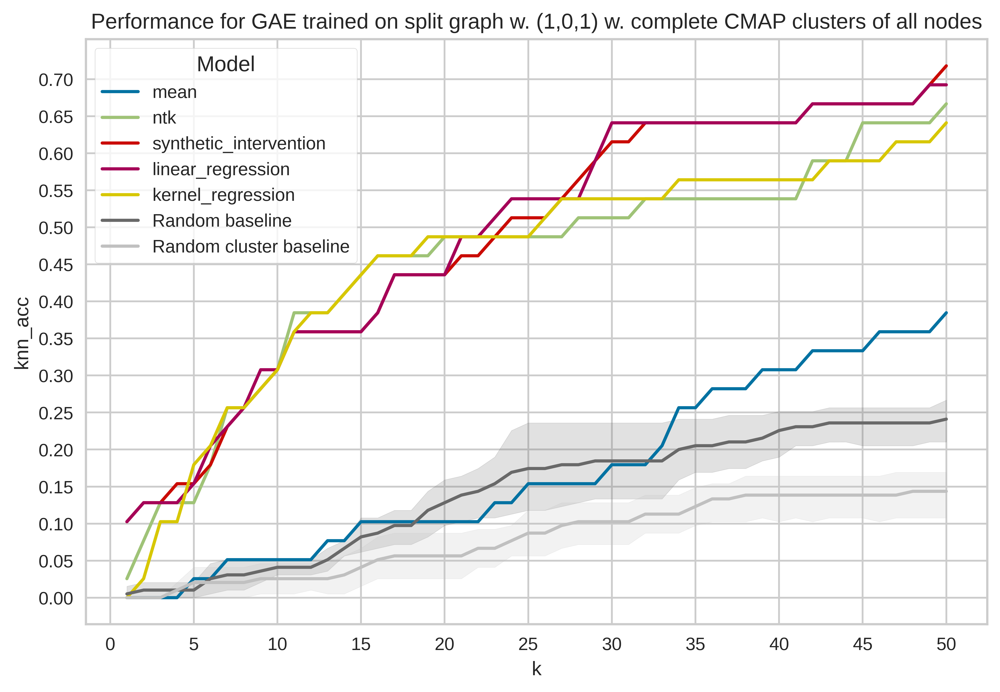

<IPython.core.display.Javascript object>

In [832]:
fig, ax = plot_translation_performance(
    results=knn_acc_results,
    perm_results=perm_knn_acc_results,
    perm_cluster_results=perm_cluster_knn_acc_results,
    ymax=0.75,
    hue="model",
    title="Performance for GAE trained on split graph w. (1,0,1) w. complete CMAP clusters of all nodes",
)
plt.show()

----

In [833]:
import pickle

with open("../../../data/experiments/exp_embs_dict.pkl", "wb") as f:
    pickle.dump(exp_embs_dict, f, pickle.HIGHEST_PROTOCOL)

<IPython.core.display.Javascript object>

In [620]:
with open("../../../data/experiments/exp_embs_dict.pkl", "rb") as f:
    exp_embs_dict = pickle.load(f)

<IPython.core.display.Javascript object>

In [834]:
with open("../../../data/experiments/knn_acc_results_dict.pkl", "wb") as f:
    pickle.dump(knn_acc_results_dict, f, pickle.HIGHEST_PROTOCOL)

<IPython.core.display.Javascript object>

In [299]:
with open("../../../data/experiments/knn_acc_results_dict.pkl", "rb") as f:
    knn_acc_results_dict = pickle.load(f)

<IPython.core.display.Javascript object>

----

### 2.2. Performance summary

We next consolidate the results of the previous experiment to show the dependence of the performance on whether or not the true graph was used during training and the different weighting of the losses.

In [712]:
rename_cluster_dict = {
    "physical": "Image clustering",
    "physical_full": "Image clustering (incl. test gene)",
    "cmap": "CMap clustering",
    "cmap_full": "CMap clustering (incl. test gene)",
    "cmap_full_all_nodes": "CMap clustering (incl. all genes)",
}

<IPython.core.display.Javascript object>

In [718]:
all_knn_acc_results = []
all_perm_knn_acc_results = []
all_perm_cluster_knn_acc_results = []

for k in knn_acc_results_dict.keys():
    all_knn_acc_results.append(knn_acc_results_dict[k]["knn_results"])
    all_perm_knn_acc_results.append(knn_acc_results_dict[k]["perm_knn_results"])
    all_perm_cluster_knn_acc_results.append(
        knn_acc_results_dict[k]["perm_cluster_knn_results"]
    )
all_knn_acc_results = pd.concat(all_knn_acc_results)
all_perm_knn_acc_results = pd.concat(all_perm_knn_acc_results)
all_perm_cluster_knn_acc_results = pd.concat(all_perm_cluster_knn_acc_results)
all_knn_acc_results.index = np.array(list(range(len(all_knn_acc_results))))
all_perm_knn_acc_results.index = np.array(list(range(len(all_perm_knn_acc_results))))
all_perm_cluster_knn_acc_results.index = np.array(
    list(range(len(all_perm_cluster_knn_acc_results)))
)

all_knn_acc_results.loc[:, "cluster"] = all_knn_acc_results.loc[:, "cluster"].map(
    rename_cluster_dict
)
all_perm_knn_acc_results.loc[:, "cluster"] = all_perm_knn_acc_results.loc[
    :, "cluster"
].map(rename_cluster_dict)
all_perm_cluster_knn_acc_results.loc[
    :, "cluster"
] = all_perm_cluster_knn_acc_results.loc[:, "cluster"].map(rename_cluster_dict)

all_knn_acc_results.loc[all_knn_acc_results.gamma == 0, "cluster"] = "No clustering"
all_perm_knn_acc_results.loc[
    all_perm_knn_acc_results.gamma == 0, "cluster"
] = "No clustering"
all_perm_cluster_knn_acc_results.loc[
    all_perm_cluster_knn_acc_results.gamma == 0, "cluster"
] = "No clustering"

<IPython.core.display.Javascript object>

In [719]:
selection_idc = list(
    all_knn_acc_results.loc[
        (
            (
                (all_knn_acc_results.gamma == 1)
                & (all_knn_acc_results.alpha == 1)
                & (all_knn_acc_results.beta == 0)
                & (all_knn_acc_results.model == "synthetic_intervention")
            )
            | (
                (all_knn_acc_results.alpha == 1)
                & (all_knn_acc_results.beta == 0)
                & (all_knn_acc_results.gamma == 0)
                & (all_knn_acc_results.model == "synthetic_intervention")
            )
        )
    ].index
)

<IPython.core.display.Javascript object>

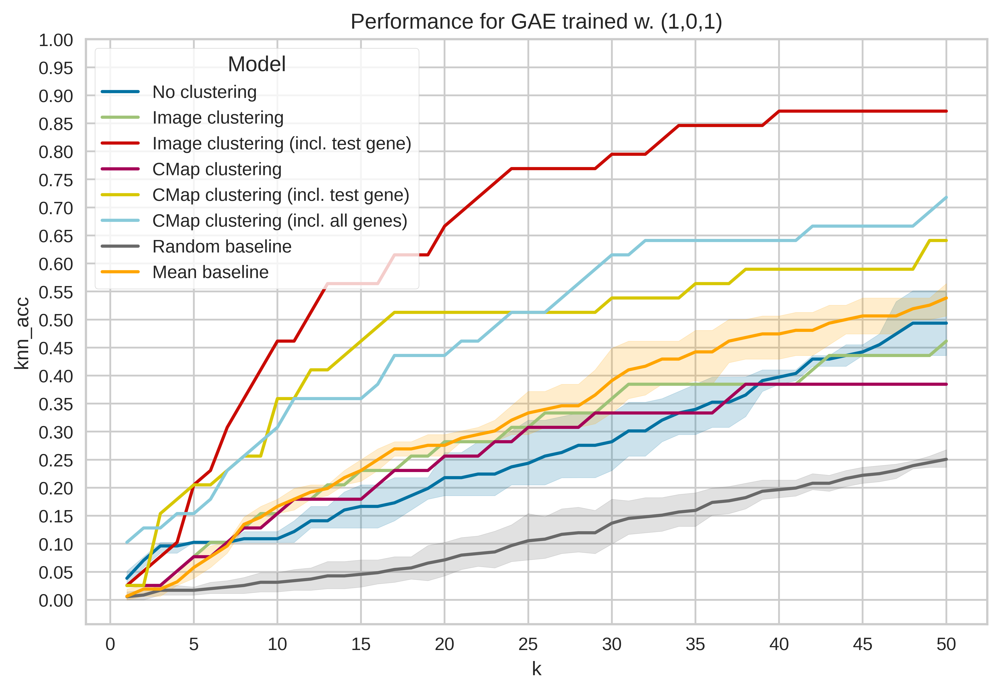

<IPython.core.display.Javascript object>

In [721]:
fig, ax = plot_translation_performance(
    results=all_knn_acc_results.loc[selection_idc],
    perm_results=all_perm_knn_acc_results.loc[selection_idc],
    mean_baseline=all_knn_acc_results.loc[
        (all_knn_acc_results.alpha == 1)
        & (all_knn_acc_results.beta == 0)
        & (all_knn_acc_results.gamma == 0)
        & (all_knn_acc_results.model == "mean")
        & (all_knn_acc_results.cluster == "No clustering")
    ],
    ymax=1.05,
    hue="cluster",
    title="Performance for GAE trained w. (1,0,1)",
)
plt.show()